### Loading the super-tensor and creating the temporal networks

In this notebook we will explore the class __temporal_nets__ to compute preliminar results using network analysis.

In [1]:
# Adding GDa to path
import sys
sys.path.insert(1, '/home/vinicius/GrayData-Analysis')
# Importing the temporal network class
from   GDa.temporal_network              import temporal_network
from   GDa.misc.create_grids             import create_stages_time_grid
from   GDa.misc.reshape                  import reshape_trials, reshape_observations
from   GDa.net.util                      import compute_coherence_thresholds
from   GDa.graphics.plot_raster          import plot_nodes_raster_all_bands 
from   GDa.graphics.plot_coherence_dists import plot_pooled_coherence_dists,\
                                                plot_pooled_coherence_dists_per_stage,\
                                                plot_pooled_coherence_dists_per_stim
from   GDa.graphics.plot_adjacency       import plot_adjacency 
from   GDa.net.layerwise                 import *
from   GDa.net.null_models               import *
from   GDa.net.temporal                  import *
import numpy                 as     np
import networkx              as     nx
import matplotlib.pyplot     as     plt
import igraph                as     ig
import leidenalg
import scipy.signal
import time
from   tqdm                  import tqdm
from   joblib                import Parallel, delayed
from   scipy                 import stats

# Just an auxiliary function to sommoth plots
def smooth(x, w):
    return scipy.signal.fftconvolve(x, np.ones(w)/w, mode='same')
# Just an auxiliary function to compute z-score
def zscore(x):
    z = np.zeros_like(x)
    for i in range(len(z)):
        if x.std() == 0:
            continue
        else:
            z[i] = (x[i]-x.mean())/x.std()
    return z
# Bands names
bands = [r'band 1', r'band 2', r'band 3', r'band 4', r'band 5']

To instantiate the __temporal_network__ we have to supply the monkey name, the session, and date to its constructor.

In [2]:
# Instantiating a temporal network object
net = temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', 
                       monkey='lucy', session=1, date='150128')

When instantiated, the temporal network object will load the recording info for the monkey, date, and sesion specified as well as the super tensor;

The super-tensor has dimensions [Number of pairs, Number of frequency bands, Number of trials * Time] (i.e., the trials are concatenated). For Lucy the frequency bands analysed are:

- band $1$  = [0.1,6]  Hz;
- band $2$  = [6,14]   Hz;
- band $3$  = [14,26]  Hz;
- band $4$  = [26,42]  Hz;
- band $5$  = [42,80]  Hz;

It is possible to check which recording information was recordes by acessing the __session_info__ dictionary:

In [3]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 750, time: 244)>
array([[[[0.54071192, 0.55821458, 0.57140218, ..., 0.72647886,
          0.74082197, 0.74872413],
         [0.67813578, 0.62362767, 0.56588393, ..., 0.32711298,
          0.36618312, 0.40811544],
         [0.60549168, 0.53122872, 0.44849803, ..., 0.46580094,
          0.5000454 , 0.54244509],
         ...,
         [0.32450651, 0.33974166, 0.35591781, ..., 0.35234191,
          0.38681689, 0.42557978],
         [0.64720398, 0.65453722, 0.66511311, ..., 0.57880609,
          0.59393075, 0.61982153],
         [0.60473229, 0.57089283, 0.53015729, ..., 0.89980894,
          0.89800121, 0.89830877]],

        [[0.8073992 , 0.79328183, 0.77090179, ..., 0.50005879,
          0.53362803, 0.56502575],
         [0.65881416, 0.65771415, 0.65573059, ..., 0.50654171,
          0.52207258, 0.53903506],
         [0.49365731, 0.48991907, 0.48411938, ..., 0.86188484,
          0.85611576, 0.84669491],
         ...,
         [0.68544238, 0.61524104, 0.54202323, ..., 0.76653936,
          0.80009527, 0.82815331],
         [0.6335628 , 0.63554076, 0.63782269, ..., 0.54566988,
          0.53733555, 0.52779312],
         [0.57608682, 0.57644372, 0.57779726, ..., 0.75894786,
          0.75613209, 0.75270975]],

        [[0.81437572, 0.8111857 , 0.80636804, ..., 0.56178392,
          0.58977927, 0.61108995],
         [0.74534042, 0.73477727, 0.72185171, ..., 0.5360356 ,
          0.55140248, 0.57346679],
         [0.45233953, 0.46799648, 0.48390753, ..., 0.93106651,
          0.93603428, 0.9382808 ],
         ...,
         [0.55676777, 0.53352588, 0.51069088, ..., 0.79025963,
          0.81044878, 0.82658329],
         [0.15644084, 0.18481279, 0.20738379, ..., 0.45351503,
          0.44699717, 0.44499447],
         [0.39822951, 0.37690522, 0.35465085, ..., 0.4094263 ,
          0.43383338, 0.4626615 ]],

        [[0.57095477, 0.5300361 , 0.49221977, ..., 0.44864857,
          0.48184858, 0.51840863],
         [0.47636843, 0.45495817, 0.43619041, ..., 0.42651045,
          0.43509462, 0.44593968],
         [0.3962867 , 0.38031596, 0.3751037 , ..., 0.6076861 ,
          0.62250932, 0.63620932],
         ...,
         [0.61124098, 0.59953823, 0.58458648, ..., 0.65635067,
          0.68273364, 0.71003817],
         [0.45021172, 0.44882584, 0.45842263, ..., 0.51894087,
          0.56146526, 0.59913013],
         [0.56532081, 0.53724101, 0.51700975, ..., 0.47907417,
          0.49227295, 0.50490977]],

        [[0.4301623 , 0.41628367, 0.40525299, ..., 0.47963148,
          0.49856235, 0.51741096],
         [0.6270314 , 0.60345954, 0.58072941, ..., 0.42824662,
          0.44196782, 0.46000221],
         [0.44199621, 0.42511197, 0.40953035, ..., 0.43141789,
          0.44738149, 0.46616056],
         ...,
         [0.58720237, 0.55995297, 0.53343741, ..., 0.57718675,
          0.5804804 , 0.58298815],
         [0.55706406, 0.54309465, 0.53423277, ..., 0.50609552,
          0.52539361, 0.53950513],
         [0.48993932, 0.45958439, 0.42906321, ..., 0.46863334,
          0.48516023, 0.50340288]]],


       [[[0.64644486, 0.66131661, 0.67439485, ..., 0.95359768,
          0.95607279, 0.95802805],
         [0.40181432, 0.36545173, 0.33280147, ..., 0.32848708,
          0.32317922, 0.31697402],
         [0.78023537, 0.75910334, 0.73642542, ..., 0.77107124,
          0.78500137, 0.8030317 ],
         ...,
         [0.28902391, 0.32442063, 0.3584525 , ..., 0.32658489,
          0.34372317, 0.37490659],
         [0.73140902, 0.73671689, 0.74120367, ..., 0.54826348,
          0.54113889, 0.53784   ],
         [0.63620849, 0.63976812, 0.64662709, ..., 0.78470348,
          0.78823908, 0.78420369]],

        [[0.66814362, 0.62190849, 0.57626586, ..., 0.53084078,
          0.57953393, 0.6268217 ],
         [0.54599459, 0.54232057, 0.54027533, ..., 0.47989055,
          0.50686279, 0.53525822],
         [0.70283677, 0.68899584, 0.67455815, ..., 0.56875824,
          0.59048251, 0.61359217],
         ...,

In [4]:
print('Recording info available:\n')
print(list(net.super_tensor.attrs.keys()))

Recording info available:

['nT', 'areas', 'channels_labels', 'fsample', 'indch', 'nC', 'nP', 'pairs', 'stim', 't_cue_off', 't_cue_on', 't_match_on']


We can plot the super tensor to visualize the time series of link strength for each band (here we plot 10 trials for better visualization).

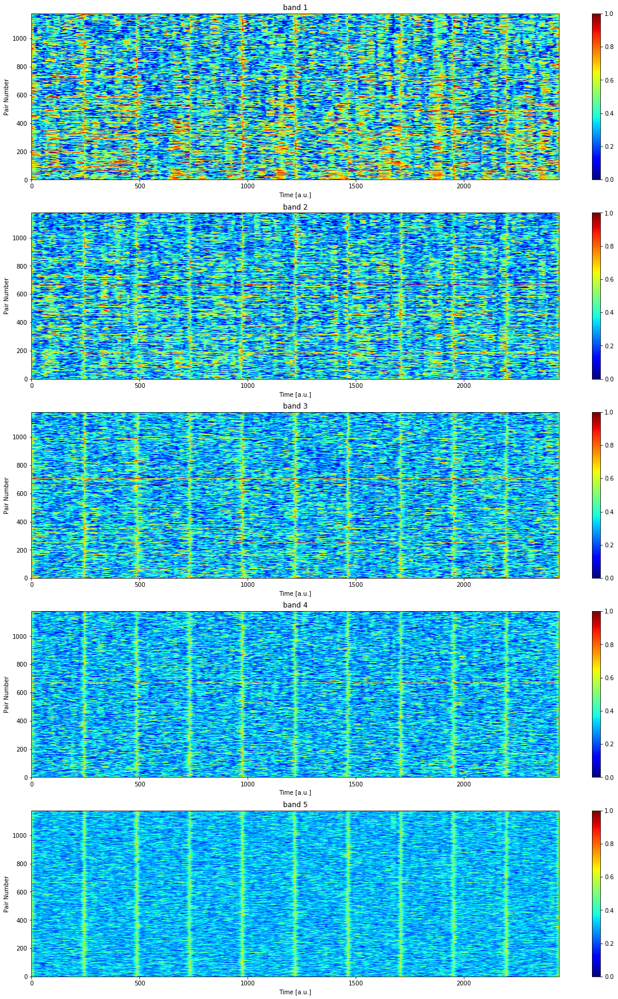

In [5]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'jet', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor_no_trim.png')

Notice that strong vertical stripes appear at the beggining/ending of each trial in the image above. This is due artifacts during wavelet estimation of pairwise coherences. To remove the border artifacts it is possible to instantiate the __temporal_network__ class specifing the parameter __trim_borders__ = True, and a value to the parameter __wt__. Doing that the firs and last __wt__ time points of the super tensor and the time array will be removed.

In [6]:
# Instantiating a temporal network object specifing trim_borders and wt.
net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                        session=1, date='150128', trim_borders=True, wt=(20,30))

Now let's plot the super tensor for the first ten trials again and observe that now the vertical stripes are gone.

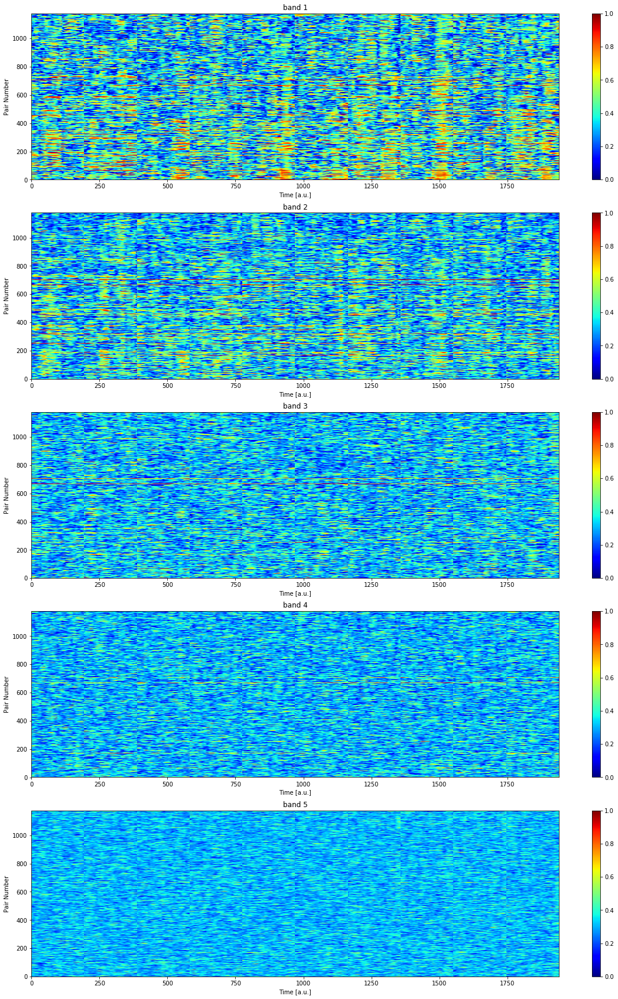

In [7]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'jet', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor.png')

### Thresholding

Some of the network theory measures can be applied to the binarized version of the network and in order to do so it is necessary to define thresholds for the coherence values, this can be done with the method __compute_thresholds__, this method receives a parameter __q__ between $0$ and $1$ that specifies that only links with coherence values in the top $(1-q)$ of the distribution will be kept.

The parameter __relative__ should be set as __False__ in case a common threshold (for each frequency band and trial) should be used for all the links or as __True__ if a threshold for each link (in each frequency band and trial) should be used instead.

In [56]:
coh_thr = compute_coherence_thresholds(net.super_tensor.values,q=0.8,relative=True)

In [57]:
coh_thr

<xarray.DataArray (links: 1176, bands: 5, trials: 750)>
array([[[0.50865515, 0.44115567, 0.46601045, ..., 0.45455206,
         0.45696153, 0.43987989],
        [0.3696611 , 0.50240729, 0.56181292, ..., 0.44232386,
         0.4890207 , 0.41237783],
        [0.44404278, 0.51189535, 0.33963904, ..., 0.42926587,
         0.3523603 , 0.40107188],
        [0.35835726, 0.45014268, 0.36238759, ..., 0.40002669,
         0.3501132 , 0.43854816],
        [0.35474391, 0.3888138 , 0.3615278 , ..., 0.3523147 ,
         0.34542356, 0.3467369 ]],

       [[0.63977062, 0.58392235, 0.53034345, ..., 0.3831253 ,
         0.48639425, 0.53641883],
        [0.50629465, 0.32316125, 0.69804472, ..., 0.54704129,
         0.44020528, 0.35600004],
        [0.44499008, 0.39154422, 0.4204495 , ..., 0.43878853,
         0.41850768, 0.44539321],
        [0.40316344, 0.39720847, 0.40950992, ..., 0.40173973,
         0.40208724, 0.35634389],
        [0.33097624, 0.40953629, 0.40290444, ..., 0.33865002,
         0.37111883, 0.35043921]],

       [[0.38667975, 0.42926638, 0.53991119, ..., 0.58167102,
         0.66315897, 0.47864002],
        [0.37466501, 0.38308938, 0.47837337, ..., 0.40917639,
         0.43677164, 0.44820372],
        [0.47676997, 0.39536355, 0.30608069, ..., 0.43695803,
         0.37716688, 0.4320288 ],
        [0.40767309, 0.40406141, 0.45041168, ..., 0.39087387,
         0.43277863, 0.43257814],
        [0.37958697, 0.33436974, 0.34191362, ..., 0.34112061,
         0.33651403, 0.37385607]],

       ...,

       [[0.42352415, 0.52232197, 0.48042491, ..., 0.44387667,
         0.5693575 , 0.59236067],
        [0.38592797, 0.42593097, 0.45130367, ..., 0.49966747,
         0.66271396, 0.64387452],
        [0.42170848, 0.42289575, 0.46533882, ..., 0.41947337,
         0.49795101, 0.41801237],
        [0.39609781, 0.2937364 , 0.41294092, ..., 0.37867237,
         0.47020907, 0.36148447],
        [0.30794736, 0.35991506, 0.36961045, ..., 0.35710044,
         0.39073025, 0.37042141]],

       [[0.61448257, 0.57882158, 0.50141062, ..., 0.62184175,
         0.85864479, 0.8302011 ],
        [0.48916608, 0.5428133 , 0.53636938, ..., 0.65371677,
         0.77336447, 0.66893987],
        [0.55036132, 0.48089093, 0.57055902, ..., 0.52829068,
         0.45137341, 0.54321112],
        [0.4836487 , 0.38455291, 0.44551887, ..., 0.48794142,
         0.4703823 , 0.49638543],
        [0.36830775, 0.38039321, 0.39119865, ..., 0.41823773,
         0.40686385, 0.49186301]],

       [[0.66905322, 0.40097436, 0.73041194, ..., 0.70431661,
         0.8420197 , 0.8505267 ],
        [0.5406522 , 0.52598133, 0.61946947, ..., 0.67605872,
         0.78075926, 0.71320077],
        [0.40552994, 0.55906954, 0.5882008 , ..., 0.50334494,
         0.4232647 , 0.57002708],
        [0.37988962, 0.467104  , 0.40612596, ..., 0.39887366,
         0.3590073 , 0.39992211],
        [0.40686024, 0.43466328, 0.38405221, ..., 0.42506363,
         0.38063394, 0.43756215]]])
Dimensions without coordinates: links, bands, trials

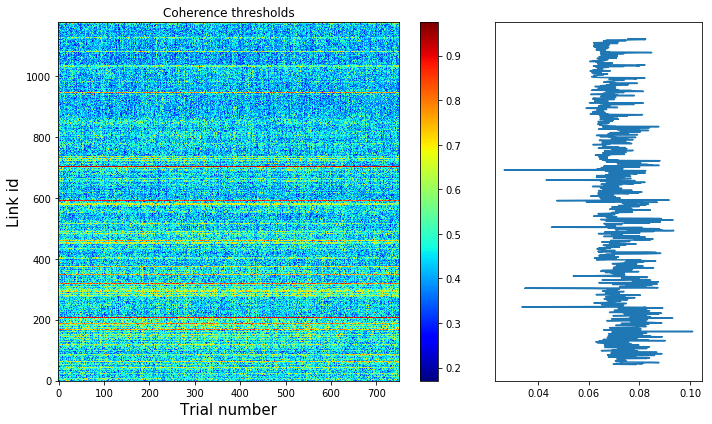

In [58]:
plt.figure(figsize=(10,6))
plt.subplot2grid((2,3), (0,0), rowspan=2, colspan=2)
plt.imshow(coh_thr[:,1,:], aspect='auto', cmap='jet', origin='lower'); plt.colorbar()
plt.ylabel('Link id', fontsize=15)
plt.xlabel('Trial number', fontsize=15)
plt.title('Coherence thresholds')
plt.subplot2grid((2,3), (0,2), rowspan=2, colspan=1)
mean_coh_thr = coh_thr[:,1,:].std(dim='trials')
plt.plot(mean_coh_thr, coh_thr.links.values)
plt.yticks([])
plt.tight_layout()

Since the __super_tensor__ and the __coh_thr__ variables are xarrays, the first can be easily thresholded.

In [59]:
st_b = net.super_tensor > coh_thr

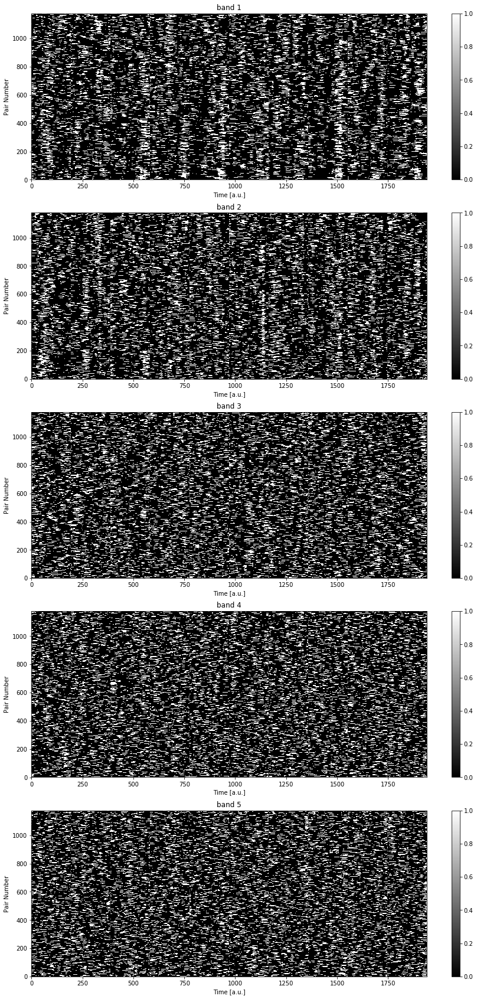

In [60]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(st_b[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'gray', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])

Alternatvely, the __temporal_network__ class can also be instantiated by setting threshold as __True__ this will automatically threshold the super-tensor.

In [8]:
# Instantiating a temporal network object without thresholding the data
net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                        session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                        relative=True, q=0.8)

  0%|          | 0/750 [00:00<?, ?it/s]

Computing coherence thresholds


100%|██████████| 750/750 [06:51<00:00,  1.82it/s]


In [9]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 750, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True, False],
         [ True,  True, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, 

In [10]:
print('Recording info available:\n')
print(list(net.super_tensor.attrs.keys()))

Recording info available:

['nT', 'areas', 'channels_labels', 'fsample', 'indch', 'nC', 'nP', 'pairs', 'stim', 't_cue_off', 't_cue_on', 't_match_on']


Let's plot the binarized super tensor:

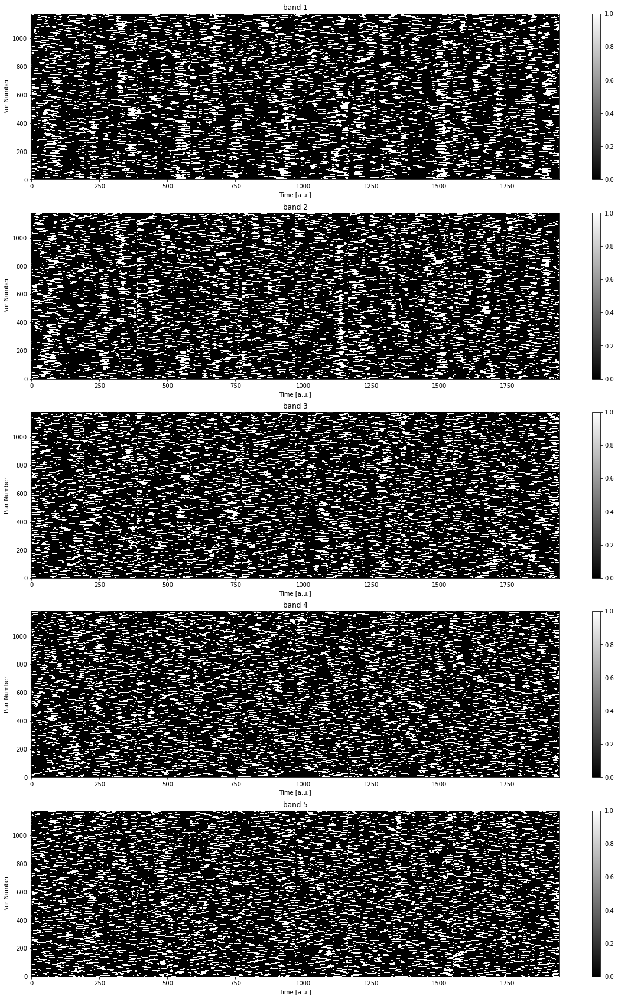

In [11]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'gray', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor_thresholded.png')

To use the Python package networkx or igraph to compute network theory quantities it is necessary to instantiate a __Graph__ object, to do so we have to provide an adjacency matrix to the __Graph__ method. Note that the super tensor is the edge representation of the network, but we can convert it to an adjacency matrix by calling the methdo __convert_to_adjacency__ in the class __temporal_network__. This method will create the variable __A__ inside the object.

In [12]:
net.convert_to_adjacency()

The adjacency matrix has dimensions [Number of channels, Number of channels Number of frequency bands, Number of trials * Time]. Let's plot both the weighted and binary adjancency matrix for the 10th observation (or time stamp) of the alpha band.

In [13]:
print( net.A.shape )

(49, 49, 5, 750, 194)


Text(0.5, 1.0, 'Binarized, band1 observation 42')

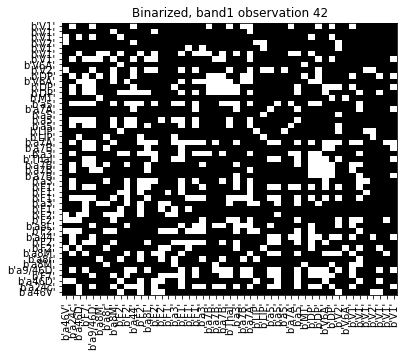

In [14]:
# Random time stamp
t_rnd = np.random.randint(0, net.super_tensor.shape[-1])
plot_adjacency(net.A[:,:,1,10,t_rnd], net.session_info['areas'], 'gray', (6,5))
plt.title(r'Binarized, band1 observation ' + str(t_rnd))

Before moving to the measures and preliminary results, during the analysis we may be interested to separate the measures we make by task stage, to do so we need some way to acess our arrays (super_tensor, adjacency matrix, node_degree...) in an specific stage. Using the method __create_stages_time_grid__ (from __GDa.misc.create_grids__), four arrays will be returned: __t_baseline__, __t_cue__, __t_delay__, and __t_match__. Using those array any stage can be acessed easily, let's suposse you want the super tensor values only for the delay period in alpha band, you can retrieve this values by doing:

```net.super_tensor[:,1,s_mask['delay']] ```

In [15]:
# Creating stages mask
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'], net.super_tensor.attrs['t_cue_off'],
                                 net.super_tensor.attrs['t_match_on'], net.super_tensor.attrs['fsample'],
                                 net.tarray, net.super_tensor.attrs['nT'])

Now let's plot for each trial the duration of each period

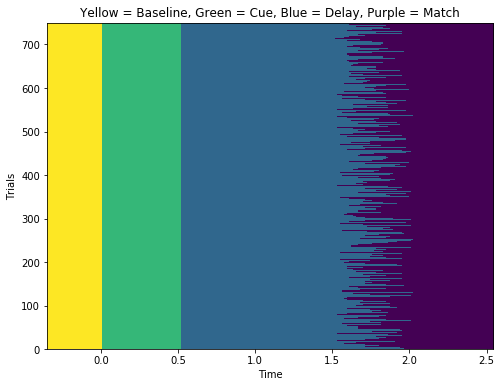

In [16]:
stages = np.zeros([net.super_tensor.attrs['nT'],len(net.tarray)])

ii     = [s_mask['baseline'].reshape(net.super_tensor.attrs['nT'],len(net.tarray)), 
          s_mask['cue'].reshape(net.super_tensor.attrs['nT'],len(net.tarray)), 
          s_mask['delay'].reshape(net.super_tensor.attrs['nT'],len(net.tarray)),
          s_mask['match'].reshape(net.super_tensor.attrs['nT'],len(net.tarray))]

for i in range(4):
    stages = stages - i * ii[i]
    
plt.figure(figsize = (8,6))
plt.imshow(stages, aspect='auto',cmap='viridis',origin='lower', extent=[net.tarray[0],net.tarray[-1],1,net.session_info['nT']])
plt.ylabel('Trials')
plt.xlabel('Time')
plt.title('Yellow = Baseline, Green = Cue, Blue = Delay, Purple = Match')
plt.savefig('../figures/layerwise_net/stages.png')

In [16]:
# Values of q used
q_list     = np.linspace(0.2, 0.9, 10)
n_retained = np.zeros([len(q_list), len(net.bands), 4]) # [Values of q, Number of bands, Number of stages]
# Computing the threshold for the specific q value
for i in tqdm( range( len( q_list) ) ):
    # Instantiating a temporal network threshold with the respective q value
    net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                            session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                            relative=True, q=q_list[i])
    for j in range( len(net.bands) ):
        # Binary super tensor
        bst               = net.super_tensor[:,j,:]
        n_retained[i,j,0] = bst[:,s_mask['baseline']].sum() / (net.session_info['nP'] * np.sum(s_mask['baseline']))
        n_retained[i,j,1] = bst[:,s_mask['cue']].sum()      / (net.session_info['nP'] * np.sum(s_mask['cue']))
        n_retained[i,j,2] = bst[:,s_mask['delay']].sum()    / (net.session_info['nP'] * np.sum(s_mask['delay']))
        n_retained[i,j,3] = bst[:,s_mask['match']].sum()    / (net.session_info['nP'] * np.sum(s_mask['match']))


100%|██████████| 10/10 [12:22<00:00, 74.26s/it]


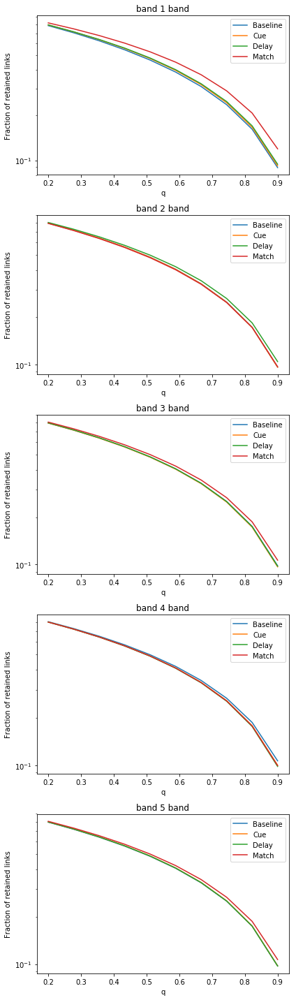

In [19]:
plt.figure(figsize=(6,20))
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    plt.semilogy(q_list, n_retained[:,j,0], label = 'Baseline')
    plt.semilogy(q_list, n_retained[:,j,1], label = 'Cue')
    plt.semilogy(q_list, n_retained[:,j,2], label = 'Delay')
    plt.semilogy(q_list, n_retained[:,j,3], label = 'Match')
    plt.title(bands[j] + ' band')
    plt.legend()
    plt.xlabel('q')
    plt.ylabel('Fraction of retained links')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/fraction_reained_links.png')

In [26]:
# Setting threshold back to q=0.8
net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                        session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                        relative=True, q=0.8)

In [27]:
net.convert_to_adjacency()

### Null models and temporal correlations

#### Creating null models for each band and randomized edges and time frames.

In [43]:
# Shuffling frames
A_s = np.empty_like(net.A)
# Randomizing edges
A_r = np.empty_like(net.A)

In [44]:
for t in tqdm( range(net.super_tensor.attrs['nT']) ):
    for i in range(len(net.bands)):
        A_s[:,:,i,t,:] = shuffle_frames(net.A[:,:,i,t,:])

100%|██████████| 750/750 [00:21<00:00, 35.53it/s]


In [45]:
for t in tqdm( range(net.super_tensor.attrs['nT']) ):
    for i in range(len(net.bands)):
        A_r[:,:,i,t,:] = randomize_edges(net.A[:,:,i,t,:], n_rewires=1000)

100%|██████████| 750/750 [10:30<00:00,  1.19it/s]


/home/vinicius/GrayData-Analysis/GDa/net/temporal.py:19: RuntimeWarning: invalid value encountered in true_divide
  Ci  = np.nansum(( num / den ), axis=1) / (A.shape[-1] - 1)


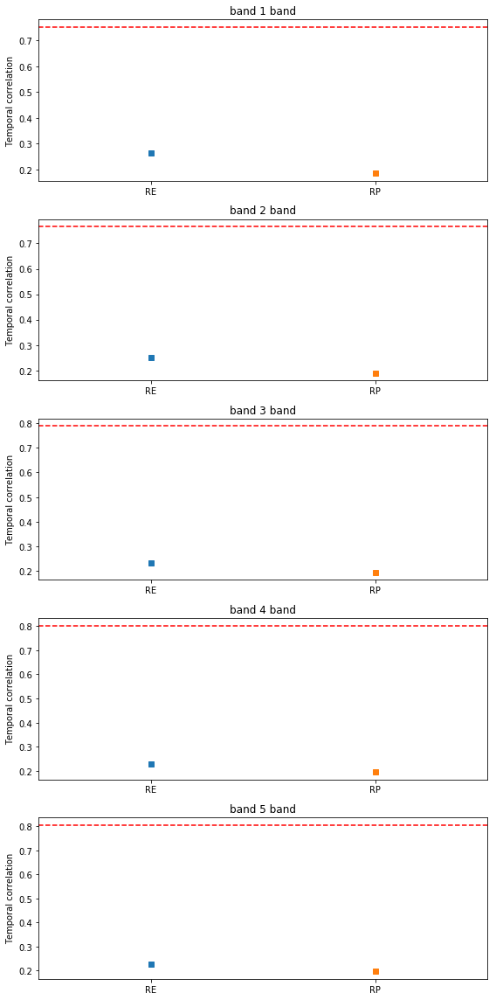

In [22]:
plt.figure(figsize=(8,16))
for i in range(len(net.bands)):
    # Original network
    CC_on = compute_temporal_correlation(
        net.A[:,:,i,:,:].reshape(net.A.shape[0],net.A.shape[1],net.A.shape[3]*net.A.shape[4])
    )
    # Randomize on edges
    CC_re = compute_temporal_correlation(
        A_r[:,:,i,:,:].reshape(A_r.shape[0],A_r.shape[1],A_r.shape[3]*A_r.shape[4])
    )
    # Randomize on time
    CC_rt = compute_temporal_correlation(
        A_s[:,:,i,:,:].reshape(A_s.shape[0],A_s.shape[1],A_s.shape[3]*A_s.shape[4])
    )
    # Plotting
    plt.subplot(5,1,i+1)
    plt.plot(1, CC_re, marker='s')
    plt.plot(3, CC_rt, marker='s')
    plt.hlines(CC_on, 0, 4, linestyle='--', color = 'r')
    plt.xlim([0,4])
    plt.ylabel('Temporal correlation')
    plt.xticks([1,3], ['RE', 'RP'])
    plt.title(bands[i])
plt.tight_layout()

### Jaccard index

In [17]:
J = {}
for i in tqdm( range(len(net.bands)) ): 
    #A_aux = reshape_trials(net.A[:,:,i,:], net.super_tensor.attrs['nT'], len(net.tarray))
    #J[str(i)] = jaccard_index(A_aux, mirror=True)
    J[str(i)] = jaccard_index(net.A[:,:,i,:,:], mirror=True)

  0%|          | 0/5 [00:00<?, ?it/s]/home/vinicius/GrayData-Analysis/GDa/net/temporal.py:53: RuntimeWarning: divide by zero encountered in true_divide
  J = num/den
/home/vinicius/GrayData-Analysis/GDa/net/temporal.py:53: RuntimeWarning: invalid value encountered in true_divide
  J = num/den
100%|██████████| 5/5 [00:31<00:00,  6.37s/it]


100%|██████████| 5/5 [00:00<00:00,  6.99it/s]


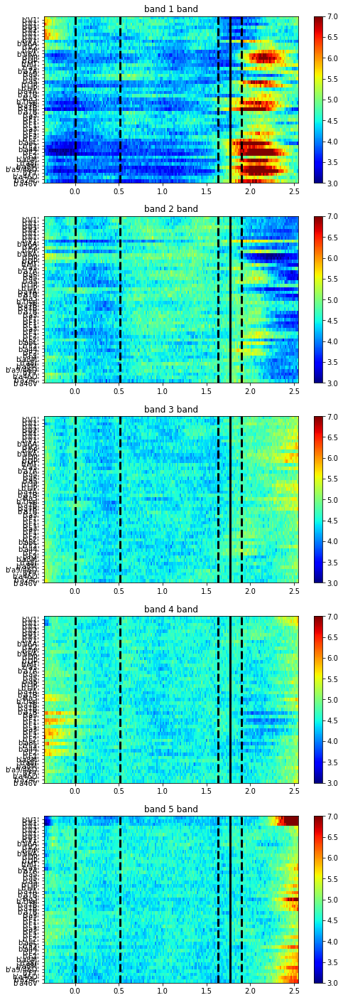

In [18]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    plt.imshow(np.nansum(J[str(i)], axis=1)/J[str(i)].shape[1], aspect = 'auto', 
                         cmap = 'jet', origin = 'lower',
                         extent = [net.tarray[0],net.tarray[-1],0,49], vmin=3, vmax=7);plt.colorbar()
    plt.vlines(0, 0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       0, 49, linestyle='-', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.yticks(range(49), net.session_info['areas'])
    plt.title(bands[i] + ' band')

100%|██████████| 5/5 [00:05<00:00,  1.12s/it]


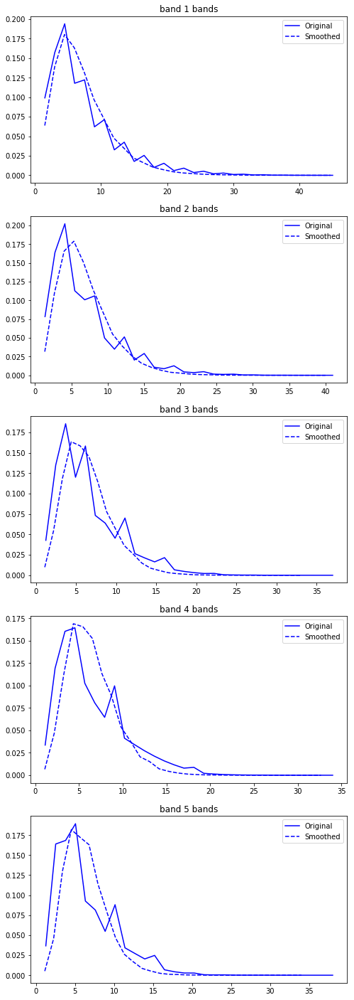

In [19]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    aux = J[str(i)][~np.isnan(J[str(i)])].flatten(order='C')
    c, x = np.histogram(aux, 30)
    plt.plot(x[1:], c/np.sum(c), 'b')
    plt.title(bands[i] + ' bands')
    c, x = np.histogram(smooth(aux, 3), 30)
    plt.plot(x[1:], c/np.sum(c), 'b--')
    plt.title(bands[i] + ' bands')
    plt.legend(['Original', 'Smoothed'])

### Filtering trials

If one wants to analyse specific trials, for instance trials were the ODRT was performed, the __trials_info__ dictionary can be used to do so. To illustrate, let's work only with trials of type 1, were the monkey was successful.

In [20]:
net.trial_info.head()

,behavioral_response,match_image,match_location,match_on,nonmatch_image,nonmatch_location,num_trials,reaction_time,sample_image,sample_location,sample_off,sample_on,trial_type
0,NaN,NaN,NaN,2654.0,NaN,NaN,1006.0,NaN,NaN,NaN,1495.0,975.0,2.0
1,1.0,2.0,7.0,2824.0,4.0,3.0,1006.0,145.0,2.0,1.0,1371.0,851.0,1.0
2,1.0,5.0,8.0,2946.0,4.0,4.0,1006.0,205.0,5.0,1.0,1600.0,1093.0,1.0
3,1.0,2.0,3.0,2954.0,3.0,7.0,1006.0,260.0,2.0,1.0,1528.0,1021.0,1.0
9,1.0,4.0,7.0,2759.0,2.0,3.0,1006.0,178.0,4.0,1.0,1480.0,973.0,1.0


In [21]:
# Getting the index for those trials
filtered_trials = net.trial_info[(net.trial_info['trial_type']==1.0)\
                                   & (net.trial_info['behavioral_response']==1.0)].index.values

In [22]:
print(filtered_trials)

[  1   2   3   9  12  13  14  15  18  19  20  21  22  27  29  30  33  35
  37  38  43  44  49  50  51  53  54  55  58  60  61  63  64  66  67  71
  72  73  74  77  78  81  82  86  89  93  96  98 101 103 106 107 109 110
 111 115 118 120 121 122 124 129 130 132 135 139 140 141 143 144 145 146
 148 150 153 154 155 156 157 158 159 160 161 162 163 164 165 167 168 170
 171 172 173 174 175 176 177 178 179 180 181 184 185 187 188 190 191 195
 196 197 198 199 200 201 203 205 206 207 208 209 211 212 215 216 217 218
 220 221 222 224 225 226 228 229 230 232 233 237 239 240 243 244 245 248
 249 250 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267
 268 270 272 273 275 277 278 279 281 282 285 287 291 292 293 295 296 298
 299 300 302 304 306 307 308 309 310 313 317 318 319 320 321 324 325 327
 328 329 330 333 334 335 336 337 338 340 341 343 346 348 349 351 354 356
 358 360 362 363 368 371 373 374 375 376 378 380 381 382 383 384 386 387
 388 389 390 391 392 397 398 401 402 403 404 405 40

In [23]:
# Filter supertensor for the desired trials
filtered_super_tensor = net.super_tensor.sel(trials = filtered_trials)

In [24]:
filtered_super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 540, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]],


       [[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]]],


       [[[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, 

### Network measures

We can use the filtered super tensor to compute all sorts of networkd measures. Let's start by analysing the network measurements averaged over trials.

In [25]:
#Q_data  = np.load('../network_statistics/tt_1_br_1.npy', allow_pickle=True).item()
#Q       = Q_data['original']
#Qr      = Q_data['null']

In [26]:
##################################################################################
# DICTIONARIES TO STORE THE NETWORK MEASURES
##################################################################################
measures = ['degree', 'clustering', 'coreness', 'modularity']

# Q is used to represent an arbritary network measurement
Q = {}
# To store the measures on the randomized networks
Qr = {}

for m in measures:
    Q[m]  = {}
    Qr[m] = {}
    for i in range(len(net.bands)):
        Q[m][str(i)]  = {}
        Qr[m][str(i)] = {}

### Node degree

In [29]:
##################################################################################
# NODES' DEGREE
##################################################################################
for i in tqdm( range(len(net.bands)) ): 
    Q['degree'][str(i)]  = compute_nodes_degree(net.A[:,:,i,:,:], mirror=True) 

100%|██████████| 5/5 [00:06<00:00,  1.39s/it]


In [32]:
 print(Q['degree'][str(i)].shape)

(49, 750, 194)


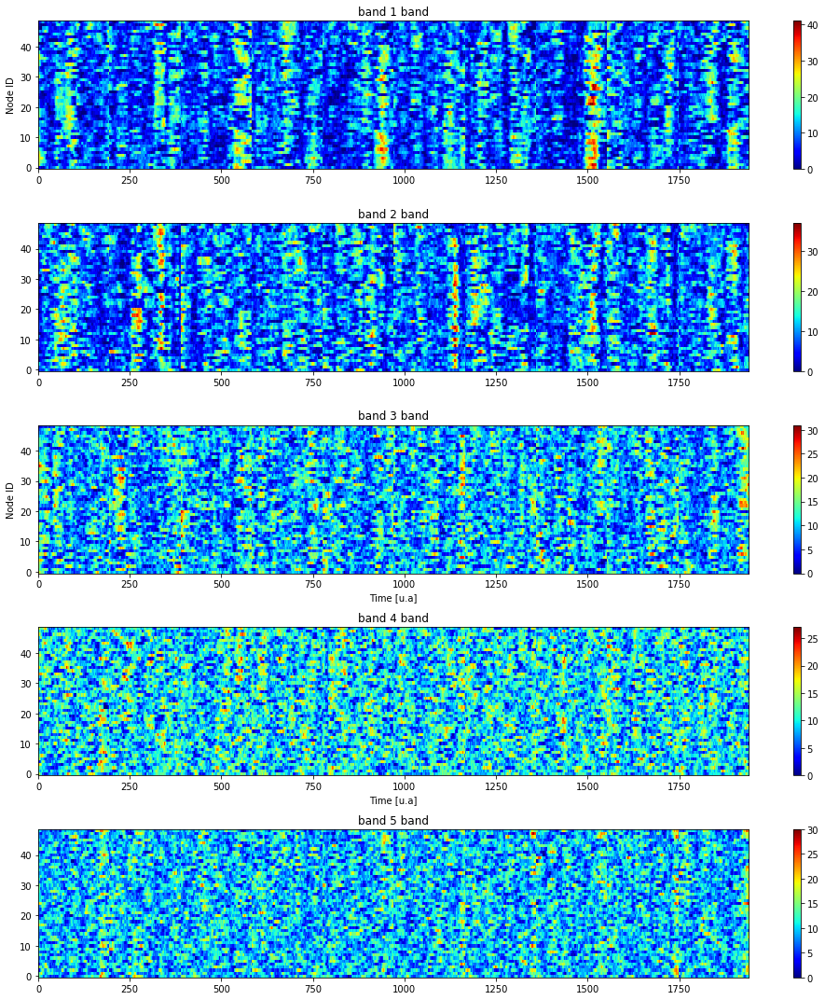

In [31]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q['degree'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_degree.png')

It is hard to compare both the weighted and binary version of the measure by means of the raster plot, however we can measure the summed strength/degree of the network for a more general view. Let's plot the the summed degree avareged on trials for each frequency band:

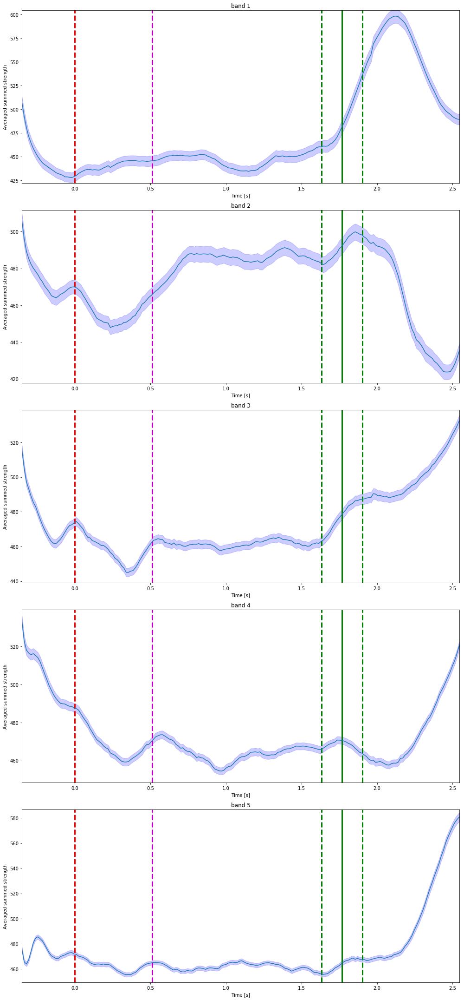

In [42]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d = Q['degree'][str(j)].sum(axis=0)
    # Average over trials
    s_d_m = s_d.mean(axis = 0)
    # Std over trials
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_strength.png')

We can also measure the same quantities for the randomized version of the adjacency matrices:

In [61]:
for i in tqdm( range(len(net.bands)) ): 
    Qr['degree'][str(i)]  = compute_nodes_degree(A_r[:,:,i,:,:], mirror=False) 

100%|██████████| 5/5 [00:03<00:00,  1.44it/s]


Let's compare a random adjacency matrix with its randomized version.

Text(0.5, 1.0, 'Randomized, band 1 observation 156')

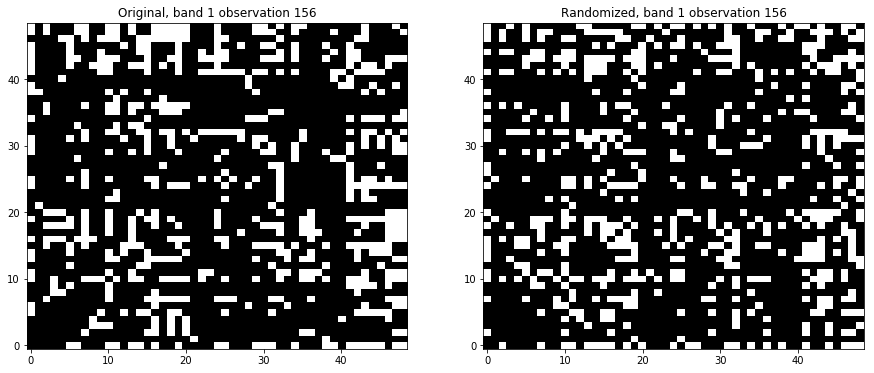

In [62]:
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
t_rnd = np.random.randint(0, net.super_tensor.shape[-1])
plt.imshow(net.A[:,:,1,10,t_rnd]+net.A[:,:,1,10,t_rnd].T, aspect='auto', cmap='gray', origin='lower')
plt.title(r'Original, band 1 observation ' + str(t_rnd))
plt.subplot(1,2,2)
plt.imshow(A_r[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin='lower')
plt.title(r'Randomized, band 1 observation ' + str(t_rnd))

Next we plot the average summed degree for the original and randomized networks

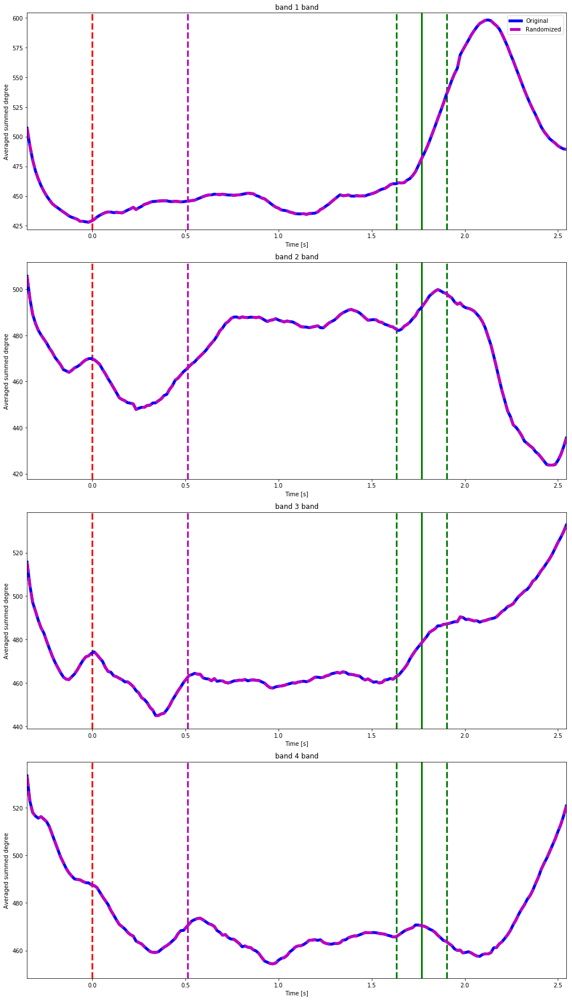

In [64]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands)-1 ):
    plt.subplot(5,1,j+1)
    # Original
    s_d = Q['degree'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d = Qr['degree'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed degree')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/strength_random_edges.png')

### Coreness 

In [65]:
for i in range(len(net.bands)):
    Q['coreness'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in tqdm( range(len(filtered_trials)) ):
    for i in range(len(net.bands)):
        Q['coreness'][str(i)][:,t,:] = compute_nodes_coreness(net.A[:,:,i,t,:], is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 2624.64it/s]

100%|██████████| 194/194 [00:00<00:00, 3780.50it/s]

100%|██████████| 194/194 [00:00<00:00, 4088.06it/s]

100%|██████████| 194/194 [00:00<00:00, 4071.67it/s]

100%|██████████| 194/194 [00:00<00:00, 4222.67it/s]

100%|██████████| 194/194 [00:00<00:00, 4223.67it/s]

100%|██████████| 194/194 [00:00<00:00, 4218.68it/s]

100%|██████████| 194/194 [00:00<00:00, 4135.68it/s]

100%|██████████| 194/194 [00:00<00:00, 4212.85it/s]

100%|██████████| 194/194 [00:00<00:00, 4215.53it/s]

100%|██████████| 194/194 [00:00<00:00, 4212.61it/s]

100%|██████████| 194/194 [00:00<00:00, 4155.77it/s]

100%|██████████| 194/194 [00:00<00:00, 5159.86it/s]

100%|██████████| 194/194 [00:00<00:00, 5454.56it/s]

100%|██████████| 194/194 [00:00<00:00, 5603.57it/s]

100%|██████████| 194/194 [00:00<00:00, 5582.28it/s]

100%|██████████| 194/194 [00:00<00:00, 5573.83it/s]

100%|██████████| 194/194 [00:00<00:00, 5572.99it/s]

100%|██████████| 194/194 [00:00<00:00, 5602.88

100%|██████████| 194/194 [00:00<00:00, 5560.30it/s]

100%|██████████| 194/194 [00:00<00:00, 5547.15it/s]

100%|██████████| 194/194 [00:00<00:00, 5565.59it/s]

100%|██████████| 194/194 [00:00<00:00, 5576.00it/s]

100%|██████████| 194/194 [00:00<00:00, 5568.64it/s]

100%|██████████| 194/194 [00:00<00:00, 5527.18it/s]

100%|██████████| 194/194 [00:00<00:00, 5553.55it/s]

100%|██████████| 194/194 [00:00<00:00, 5568.33it/s]

100%|██████████| 194/194 [00:00<00:00, 5533.57it/s]

100%|██████████| 194/194 [00:00<00:00, 5578.07it/s]

100%|██████████| 194/194 [00:00<00:00, 5555.52it/s]

100%|██████████| 194/194 [00:00<00:00, 5545.07it/s]

100%|██████████| 194/194 [00:00<00:00, 5543.75it/s]

100%|██████████| 194/194 [00:00<00:00, 2553.93it/s]

100%|██████████| 194/194 [00:00<00:00, 5102.85it/s]

100%|██████████| 194/194 [00:00<00:00, 5324.95it/s]

100%|██████████| 194/194 [00:00<00:00, 5486.56it/s]

100%|██████████| 194/194 [00:00<00:00, 5533.83it/s]

100%|██████████| 194/194 [00:00<00:00, 5511.23

100%|██████████| 194/194 [00:00<00:00, 5526.39it/s]

100%|██████████| 194/194 [00:00<00:00, 5529.06it/s]

100%|██████████| 194/194 [00:00<00:00, 5535.90it/s]

100%|██████████| 194/194 [00:00<00:00, 5511.79it/s]

100%|██████████| 194/194 [00:00<00:00, 5486.04it/s]

100%|██████████| 194/194 [00:00<00:00, 5510.26it/s]

100%|██████████| 194/194 [00:00<00:00, 5517.14it/s]

100%|██████████| 194/194 [00:00<00:00, 5519.72it/s]

100%|██████████| 194/194 [00:00<00:00, 5403.52it/s]

100%|██████████| 194/194 [00:00<00:00, 5601.30it/s]

100%|██████████| 194/194 [00:00<00:00, 5617.93it/s]

100%|██████████| 194/194 [00:00<00:00, 5583.27it/s]

100%|██████████| 194/194 [00:00<00:00, 5528.04it/s]

100%|██████████| 194/194 [00:00<00:00, 5608.40it/s]

100%|██████████| 194/194 [00:00<00:00, 5612.42it/s]

100%|██████████| 194/194 [00:00<00:00, 5592.75it/s]

100%|██████████| 194/194 [00:00<00:00, 5579.79it/s]

100%|██████████| 194/194 [00:00<00:00, 5604.11it/s]

100%|██████████| 194/194 [00:00<00:00, 5599.79

100%|██████████| 194/194 [00:00<00:00, 5609.41it/s]

100%|██████████| 194/194 [00:00<00:00, 5572.83it/s]

100%|██████████| 194/194 [00:00<00:00, 5597.79it/s]

100%|██████████| 194/194 [00:00<00:00, 5607.59it/s]

100%|██████████| 194/194 [00:00<00:00, 5614.94it/s]

100%|██████████| 194/194 [00:00<00:00, 5561.03it/s]

100%|██████████| 194/194 [00:00<00:00, 5568.83it/s]

100%|██████████| 194/194 [00:00<00:00, 5588.45it/s]

100%|██████████| 194/194 [00:00<00:00, 5615.56it/s]

100%|██████████| 194/194 [00:00<00:00, 5589.49it/s]

100%|██████████| 194/194 [00:00<00:00, 5564.07it/s]

100%|██████████| 194/194 [00:00<00:00, 5608.17it/s]

100%|██████████| 194/194 [00:00<00:00, 5608.17it/s]

100%|██████████| 194/194 [00:00<00:00, 5582.31it/s]

100%|██████████| 194/194 [00:00<00:00, 5573.56it/s]

100%|██████████| 194/194 [00:00<00:00, 5583.46it/s]

100%|██████████| 194/194 [00:00<00:00, 3713.37it/s]

100%|██████████| 194/194 [00:00<00:00, 5323.70it/s]

100%|██████████| 194/194 [00:00<00:00, 5593.33

100%|██████████| 194/194 [00:00<00:00, 5176.08it/s]

100%|██████████| 194/194 [00:00<00:00, 5319.69it/s]

100%|██████████| 194/194 [00:00<00:00, 5136.87it/s]

100%|██████████| 194/194 [00:00<00:00, 5141.86it/s]

100%|██████████| 194/194 [00:00<00:00, 5131.65it/s]

100%|██████████| 194/194 [00:00<00:00, 4513.03it/s]

100%|██████████| 194/194 [00:00<00:00, 4782.17it/s]

100%|██████████| 194/194 [00:00<00:00, 4932.38it/s]

100%|██████████| 194/194 [00:00<00:00, 5119.54it/s]

100%|██████████| 194/194 [00:00<00:00, 5084.42it/s]

100%|██████████| 194/194 [00:00<00:00, 5160.62it/s]

100%|██████████| 194/194 [00:00<00:00, 5112.72it/s]

100%|██████████| 194/194 [00:00<00:00, 5151.47it/s]

100%|██████████| 194/194 [00:00<00:00, 5154.70it/s]

100%|██████████| 194/194 [00:00<00:00, 4771.06it/s]

100%|██████████| 194/194 [00:00<00:00, 5176.11it/s]

100%|██████████| 194/194 [00:00<00:00, 5299.39it/s]

100%|██████████| 194/194 [00:00<00:00, 5281.33it/s]

100%|██████████| 194/194 [00:00<00:00, 5275.92

100%|██████████| 194/194 [00:00<00:00, 5204.62it/s]

100%|██████████| 194/194 [00:00<00:00, 5257.55it/s]

100%|██████████| 194/194 [00:00<00:00, 5211.65it/s]

100%|██████████| 194/194 [00:00<00:00, 4664.83it/s]

100%|██████████| 194/194 [00:00<00:00, 5169.90it/s]

100%|██████████| 194/194 [00:00<00:00, 5189.25it/s]

100%|██████████| 194/194 [00:00<00:00, 5127.45it/s]

100%|██████████| 194/194 [00:00<00:00, 5087.25it/s]

100%|██████████| 194/194 [00:00<00:00, 5258.36it/s]

100%|██████████| 194/194 [00:00<00:00, 5007.14it/s]

100%|██████████| 194/194 [00:00<00:00, 5228.29it/s]

100%|██████████| 194/194 [00:00<00:00, 4975.08it/s]

100%|██████████| 194/194 [00:00<00:00, 4771.76it/s]

100%|██████████| 194/194 [00:00<00:00, 5278.56it/s]

100%|██████████| 194/194 [00:00<00:00, 5234.41it/s]

100%|██████████| 194/194 [00:00<00:00, 4760.12it/s]

100%|██████████| 194/194 [00:00<00:00, 5212.15it/s]

100%|██████████| 194/194 [00:00<00:00, 5064.39it/s]

100%|██████████| 194/194 [00:00<00:00, 5202.65

100%|██████████| 194/194 [00:00<00:00, 3885.52it/s]

100%|██████████| 194/194 [00:00<00:00, 4270.56it/s]

100%|██████████| 194/194 [00:00<00:00, 4182.40it/s]

100%|██████████| 194/194 [00:00<00:00, 4161.48it/s]

100%|██████████| 194/194 [00:00<00:00, 4202.41it/s]

100%|██████████| 194/194 [00:00<00:00, 4182.32it/s]

100%|██████████| 194/194 [00:00<00:00, 4232.77it/s]

100%|██████████| 194/194 [00:00<00:00, 3875.07it/s]

100%|██████████| 194/194 [00:00<00:00, 4261.30it/s]

100%|██████████| 194/194 [00:00<00:00, 4260.65it/s]

100%|██████████| 194/194 [00:00<00:00, 4244.65it/s]

100%|██████████| 194/194 [00:00<00:00, 4251.12it/s]

100%|██████████| 194/194 [00:00<00:00, 4176.56it/s]

100%|██████████| 194/194 [00:00<00:00, 4248.31it/s]

100%|██████████| 194/194 [00:00<00:00, 4233.30it/s]

100%|██████████| 194/194 [00:00<00:00, 5036.08it/s]

100%|██████████| 194/194 [00:00<00:00, 5461.41it/s]

100%|██████████| 194/194 [00:00<00:00, 5635.59it/s]

100%|██████████| 194/194 [00:00<00:00, 5643.53

100%|██████████| 194/194 [00:00<00:00, 5566.85it/s]

100%|██████████| 194/194 [00:00<00:00, 5571.57it/s]

100%|██████████| 194/194 [00:00<00:00, 5633.29it/s]

100%|██████████| 194/194 [00:00<00:00, 5650.66it/s]

100%|██████████| 194/194 [00:00<00:00, 5635.55it/s]

100%|██████████| 194/194 [00:00<00:00, 5660.25it/s]

100%|██████████| 194/194 [00:00<00:00, 5639.58it/s]

100%|██████████| 194/194 [00:00<00:00, 5610.45it/s]

100%|██████████| 194/194 [00:00<00:00, 5597.83it/s]

100%|██████████| 194/194 [00:00<00:00, 5276.95it/s]

100%|██████████| 194/194 [00:00<00:00, 5641.49it/s]

100%|██████████| 194/194 [00:00<00:00, 5562.36it/s]

100%|██████████| 194/194 [00:00<00:00, 5543.18it/s]

100%|██████████| 194/194 [00:00<00:00, 5597.75it/s]

100%|██████████| 194/194 [00:00<00:00, 5568.60it/s]

100%|██████████| 194/194 [00:00<00:00, 5533.08it/s]

100%|██████████| 194/194 [00:00<00:00, 5627.21it/s]

100%|██████████| 194/194 [00:00<00:00, 5651.84it/s]

100%|██████████| 194/194 [00:00<00:00, 5113.37

100%|██████████| 194/194 [00:00<00:00, 5562.89it/s]

100%|██████████| 194/194 [00:00<00:00, 5562.97it/s]

100%|██████████| 194/194 [00:00<00:00, 5510.67it/s]

100%|██████████| 194/194 [00:00<00:00, 5646.82it/s]

100%|██████████| 194/194 [00:00<00:00, 5609.48it/s]

100%|██████████| 194/194 [00:00<00:00, 5620.14it/s]

100%|██████████| 194/194 [00:00<00:00, 5225.00it/s]

100%|██████████| 194/194 [00:00<00:00, 5624.61it/s]

100%|██████████| 194/194 [00:00<00:00, 5609.76it/s]

100%|██████████| 194/194 [00:00<00:00, 5634.85it/s]

100%|██████████| 194/194 [00:00<00:00, 5627.29it/s]

100%|██████████| 194/194 [00:00<00:00, 5655.69it/s]

100%|██████████| 194/194 [00:00<00:00, 5584.58it/s]

100%|██████████| 194/194 [00:00<00:00, 5661.31it/s]

100%|██████████| 194/194 [00:00<00:00, 5651.76it/s]

100%|██████████| 194/194 [00:00<00:00, 5275.55it/s]

100%|██████████| 194/194 [00:00<00:00, 5654.94it/s]

100%|██████████| 194/194 [00:00<00:00, 5628.96it/s]

100%|██████████| 194/194 [00:00<00:00, 5626.12

100%|██████████| 194/194 [00:00<00:00, 5502.70it/s]

100%|██████████| 194/194 [00:00<00:00, 5532.93it/s]

100%|██████████| 194/194 [00:00<00:00, 5486.45it/s]

100%|██████████| 194/194 [00:00<00:00, 5412.73it/s]

100%|██████████| 194/194 [00:00<00:00, 5510.11it/s]

100%|██████████| 194/194 [00:00<00:00, 5519.49it/s]

100%|██████████| 194/194 [00:00<00:00, 5568.87it/s]

100%|██████████| 194/194 [00:00<00:00, 5570.20it/s]

100%|██████████| 194/194 [00:00<00:00, 5580.06it/s]

100%|██████████| 194/194 [00:00<00:00, 5612.89it/s]

100%|██████████| 194/194 [00:00<00:00, 5618.12it/s]

100%|██████████| 194/194 [00:00<00:00, 5578.07it/s]

100%|██████████| 194/194 [00:00<00:00, 5608.05it/s]

100%|██████████| 194/194 [00:00<00:00, 5605.66it/s]

100%|██████████| 194/194 [00:00<00:00, 5567.34it/s]

100%|██████████| 194/194 [00:00<00:00, 5599.18it/s]

100%|██████████| 194/194 [00:00<00:00, 5600.72it/s]

100%|██████████| 194/194 [00:00<00:00, 5621.89it/s]

100%|██████████| 194/194 [00:00<00:00, 5608.83

100%|██████████| 194/194 [00:00<00:00, 5608.98it/s]

100%|██████████| 194/194 [00:00<00:00, 5621.30it/s]

100%|██████████| 194/194 [00:00<00:00, 5628.61it/s]

100%|██████████| 194/194 [00:00<00:00, 5524.97it/s]

100%|██████████| 194/194 [00:00<00:00, 5546.17it/s]

100%|██████████| 194/194 [00:00<00:00, 5540.81it/s]

100%|██████████| 194/194 [00:00<00:00, 5574.48it/s]

100%|██████████| 194/194 [00:00<00:00, 5606.01it/s]

100%|██████████| 194/194 [00:00<00:00, 5586.42it/s]

100%|██████████| 194/194 [00:00<00:00, 5593.33it/s]

100%|██████████| 194/194 [00:00<00:00, 5617.85it/s]

100%|██████████| 194/194 [00:00<00:00, 5635.75it/s]

100%|██████████| 194/194 [00:00<00:00, 5593.60it/s]

100%|██████████| 194/194 [00:00<00:00, 5604.54it/s]

100%|██████████| 194/194 [00:00<00:00, 5611.30it/s]

100%|██████████| 194/194 [00:00<00:00, 5615.87it/s]

100%|██████████| 194/194 [00:00<00:00, 5595.56it/s]

100%|██████████| 194/194 [00:00<00:00, 5613.16it/s]

100%|██████████| 194/194 [00:00<00:00, 5608.94

100%|██████████| 194/194 [00:00<00:00, 5507.20it/s]

100%|██████████| 194/194 [00:00<00:00, 5530.07it/s]

100%|██████████| 194/194 [00:00<00:00, 5481.42it/s]

100%|██████████| 194/194 [00:00<00:00, 5485.67it/s]

100%|██████████| 194/194 [00:00<00:00, 5556.17it/s]

100%|██████████| 194/194 [00:00<00:00, 5505.97it/s]

100%|██████████| 194/194 [00:00<00:00, 5541.86it/s]

100%|██████████| 194/194 [00:00<00:00, 5513.96it/s]

100%|██████████| 194/194 [00:00<00:00, 5554.80it/s]

100%|██████████| 194/194 [00:00<00:00, 5561.71it/s]

100%|██████████| 194/194 [00:00<00:00, 5569.90it/s]

100%|██████████| 194/194 [00:00<00:00, 5571.57it/s]

100%|██████████| 194/194 [00:00<00:00, 5553.78it/s]

100%|██████████| 194/194 [00:00<00:00, 5574.93it/s]

100%|██████████| 194/194 [00:00<00:00, 5573.14it/s]

100%|██████████| 194/194 [00:00<00:00, 5572.38it/s]

100%|██████████| 194/194 [00:00<00:00, 5566.01it/s]

100%|██████████| 194/194 [00:00<00:00, 5537.60it/s]

100%|██████████| 194/194 [00:00<00:00, 5559.96

100%|██████████| 194/194 [00:00<00:00, 5575.05it/s]

100%|██████████| 194/194 [00:00<00:00, 5576.42it/s]

100%|██████████| 194/194 [00:00<00:00, 5585.04it/s]

100%|██████████| 194/194 [00:00<00:00, 5566.39it/s]

100%|██████████| 194/194 [00:00<00:00, 5546.51it/s]

100%|██████████| 194/194 [00:00<00:00, 5576.88it/s]

100%|██████████| 194/194 [00:00<00:00, 5571.65it/s]

100%|██████████| 194/194 [00:00<00:00, 5560.38it/s]

100%|██████████| 194/194 [00:00<00:00, 5552.49it/s]

100%|██████████| 194/194 [00:00<00:00, 5574.55it/s]

100%|██████████| 194/194 [00:00<00:00, 5577.03it/s]

100%|██████████| 194/194 [00:00<00:00, 5628.11it/s]

100%|██████████| 194/194 [00:00<00:00, 5575.81it/s]

100%|██████████| 194/194 [00:00<00:00, 5560.23it/s]

100%|██████████| 194/194 [00:00<00:00, 5553.32it/s]

100%|██████████| 194/194 [00:00<00:00, 5561.48it/s]

100%|██████████| 194/194 [00:00<00:00, 5564.72it/s]

100%|██████████| 194/194 [00:00<00:00, 5526.62it/s]

100%|██████████| 194/194 [00:00<00:00, 5570.81

100%|██████████| 194/194 [00:00<00:00, 5654.39it/s]

100%|██████████| 194/194 [00:00<00:00, 5657.26it/s]

100%|██████████| 194/194 [00:00<00:00, 5696.47it/s]

100%|██████████| 194/194 [00:00<00:00, 5811.77it/s]

100%|██████████| 194/194 [00:00<00:00, 5801.54it/s]

100%|██████████| 194/194 [00:00<00:00, 5811.32it/s]

100%|██████████| 194/194 [00:00<00:00, 5802.20it/s]

100%|██████████| 194/194 [00:00<00:00, 5778.84it/s]

100%|██████████| 194/194 [00:00<00:00, 5787.59it/s]

100%|██████████| 194/194 [00:00<00:00, 5811.36it/s]

100%|██████████| 194/194 [00:00<00:00, 5809.29it/s]

100%|██████████| 194/194 [00:00<00:00, 5803.86it/s]

100%|██████████| 194/194 [00:00<00:00, 5798.81it/s]

100%|██████████| 194/194 [00:00<00:00, 5711.18it/s]

100%|██████████| 194/194 [00:00<00:00, 5742.30it/s]

100%|██████████| 194/194 [00:00<00:00, 5776.75it/s]

100%|██████████| 194/194 [00:00<00:00, 5812.94it/s]

100%|██████████| 194/194 [00:00<00:00, 5815.01it/s]

100%|██████████| 194/194 [00:00<00:00, 5832.65

100%|██████████| 194/194 [00:00<00:00, 5813.31it/s]

100%|██████████| 194/194 [00:00<00:00, 5824.05it/s]

100%|██████████| 194/194 [00:00<00:00, 5807.96it/s]

100%|██████████| 194/194 [00:00<00:00, 5692.80it/s]

100%|██████████| 194/194 [00:00<00:00, 5719.33it/s]

100%|██████████| 194/194 [00:00<00:00, 5762.67it/s]

100%|██████████| 194/194 [00:00<00:00, 5775.68it/s]

100%|██████████| 194/194 [00:00<00:00, 5801.75it/s]

100%|██████████| 194/194 [00:00<00:00, 5723.19it/s]

100%|██████████| 194/194 [00:00<00:00, 5817.51it/s]

100%|██████████| 194/194 [00:00<00:00, 5726.90it/s]

100%|██████████| 194/194 [00:00<00:00, 5778.39it/s]

100%|██████████| 194/194 [00:00<00:00, 5789.73it/s]

100%|██████████| 194/194 [00:00<00:00, 5803.11it/s]

100%|██████████| 194/194 [00:00<00:00, 5814.93it/s]

100%|██████████| 194/194 [00:00<00:00, 5815.72it/s]

100%|██████████| 194/194 [00:00<00:00, 5797.08it/s]

100%|██████████| 194/194 [00:00<00:00, 5804.56it/s]

100%|██████████| 194/194 [00:00<00:00, 5696.87

100%|██████████| 194/194 [00:00<00:00, 3289.08it/s]

100%|██████████| 194/194 [00:00<00:00, 5003.72it/s]

100%|██████████| 194/194 [00:00<00:00, 5678.74it/s]

100%|██████████| 194/194 [00:00<00:00, 5720.66it/s]

100%|██████████| 194/194 [00:00<00:00, 5740.07it/s]

100%|██████████| 194/194 [00:00<00:00, 5733.92it/s]

100%|██████████| 194/194 [00:00<00:00, 5742.54it/s]

100%|██████████| 194/194 [00:00<00:00, 5802.53it/s]

100%|██████████| 194/194 [00:00<00:00, 5809.41it/s]

100%|██████████| 194/194 [00:00<00:00, 5719.21it/s]

100%|██████████| 194/194 [00:00<00:00, 5803.73it/s]

100%|██████████| 194/194 [00:00<00:00, 5812.02it/s]

100%|██████████| 194/194 [00:00<00:00, 5810.70it/s]

100%|██████████| 194/194 [00:00<00:00, 5804.89it/s]

100%|██████████| 194/194 [00:00<00:00, 5784.79it/s]

100%|██████████| 194/194 [00:00<00:00, 5758.31it/s]

100%|██████████| 194/194 [00:00<00:00, 5642.55it/s]

100%|██████████| 194/194 [00:00<00:00, 5760.10it/s]

100%|██████████| 194/194 [00:00<00:00, 5722.51

100%|██████████| 194/194 [00:00<00:00, 5841.48it/s]

100%|██████████| 194/194 [00:00<00:00, 5807.25it/s]

100%|██████████| 194/194 [00:00<00:00, 5826.72it/s]

100%|██████████| 194/194 [00:00<00:00, 5782.08it/s]

100%|██████████| 194/194 [00:00<00:00, 5812.52it/s]

100%|██████████| 194/194 [00:00<00:00, 5803.19it/s]

100%|██████████| 194/194 [00:00<00:00, 5833.69it/s]

100%|██████████| 194/194 [00:00<00:00, 5807.38it/s]

100%|██████████| 194/194 [00:00<00:00, 5837.00it/s]

100%|██████████| 194/194 [00:00<00:00, 5808.70it/s]

100%|██████████| 194/194 [00:00<00:00, 5796.70it/s]

100%|██████████| 194/194 [00:00<00:00, 5818.01it/s]

100%|██████████| 194/194 [00:00<00:00, 5809.00it/s]

100%|██████████| 194/194 [00:00<00:00, 5782.53it/s]

100%|██████████| 194/194 [00:00<00:00, 5816.76it/s]

100%|██████████| 194/194 [00:00<00:00, 5800.55it/s]

100%|██████████| 194/194 [00:00<00:00, 5811.07it/s]

100%|██████████| 194/194 [00:00<00:00, 5842.07it/s]

100%|██████████| 194/194 [00:00<00:00, 5821.59

100%|██████████| 194/194 [00:00<00:00, 5781.83it/s]

100%|██████████| 194/194 [00:00<00:00, 5725.93it/s]

100%|██████████| 194/194 [00:00<00:00, 5750.98it/s]

100%|██████████| 194/194 [00:00<00:00, 4234.03it/s]

100%|██████████| 194/194 [00:00<00:00, 5543.49it/s]

100%|██████████| 194/194 [00:00<00:00, 5753.06it/s]

100%|██████████| 194/194 [00:00<00:00, 5766.55it/s]

100%|██████████| 194/194 [00:00<00:00, 5795.92it/s]

100%|██████████| 194/194 [00:00<00:00, 5786.32it/s]

100%|██████████| 194/194 [00:00<00:00, 5804.19it/s]

100%|██████████| 194/194 [00:00<00:00, 5809.37it/s]

100%|██████████| 194/194 [00:00<00:00, 5818.42it/s]

100%|██████████| 194/194 [00:00<00:00, 5813.93it/s]

100%|██████████| 194/194 [00:00<00:00, 5757.37it/s]

100%|██████████| 194/194 [00:00<00:00, 5798.81it/s]

100%|██████████| 194/194 [00:00<00:00, 5706.34it/s]

100%|██████████| 194/194 [00:00<00:00, 5715.35it/s]

100%|██████████| 194/194 [00:00<00:00, 5721.70it/s]

100%|██████████| 194/194 [00:00<00:00, 5761.08

100%|██████████| 194/194 [00:00<00:00, 5810.94it/s]

100%|██████████| 194/194 [00:00<00:00, 5818.88it/s]

100%|██████████| 194/194 [00:00<00:00, 5826.88it/s]

100%|██████████| 194/194 [00:00<00:00, 5800.84it/s]

100%|██████████| 194/194 [00:00<00:00, 5718.89it/s]

100%|██████████| 194/194 [00:00<00:00, 5760.63it/s]

100%|██████████| 194/194 [00:00<00:00, 5727.46it/s]

100%|██████████| 194/194 [00:00<00:00, 5731.58it/s]

100%|██████████| 194/194 [00:00<00:00, 5747.25it/s]

100%|██████████| 194/194 [00:00<00:00, 5760.26it/s]

100%|██████████| 194/194 [00:00<00:00, 5722.55it/s]

100%|██████████| 194/194 [00:00<00:00, 5717.12it/s]

100%|██████████| 194/194 [00:00<00:00, 5731.54it/s]

100%|██████████| 194/194 [00:00<00:00, 5767.12it/s]

100%|██████████| 194/194 [00:00<00:00, 5771.05it/s]

100%|██████████| 194/194 [00:00<00:00, 5735.38it/s]

100%|██████████| 194/194 [00:00<00:00, 5736.02it/s]

100%|██████████| 194/194 [00:00<00:00, 5773.96it/s]

100%|██████████| 194/194 [00:00<00:00, 5729.24

100%|██████████| 194/194 [00:00<00:00, 5782.16it/s]

100%|██████████| 194/194 [00:00<00:00, 5780.03it/s]

100%|██████████| 194/194 [00:00<00:00, 5812.31it/s]

100%|██████████| 194/194 [00:00<00:00, 5708.90it/s]

100%|██████████| 194/194 [00:00<00:00, 5820.01it/s]

100%|██████████| 194/194 [00:00<00:00, 5814.68it/s]

100%|██████████| 194/194 [00:00<00:00, 5727.30it/s]

100%|██████████| 194/194 [00:00<00:00, 3517.81it/s]

100%|██████████| 194/194 [00:00<00:00, 4782.25it/s]

100%|██████████| 194/194 [00:00<00:00, 5602.07it/s]

100%|██████████| 194/194 [00:00<00:00, 5799.89it/s]

100%|██████████| 194/194 [00:00<00:00, 5830.22it/s]

100%|██████████| 194/194 [00:00<00:00, 5813.93it/s]

100%|██████████| 194/194 [00:00<00:00, 5790.31it/s]

100%|██████████| 194/194 [00:00<00:00, 5826.97it/s]

100%|██████████| 194/194 [00:00<00:00, 5810.45it/s]

100%|██████████| 194/194 [00:00<00:00, 5816.05it/s]

100%|██████████| 194/194 [00:00<00:00, 5799.39it/s]

100%|██████████| 194/194 [00:00<00:00, 5768.51

100%|██████████| 194/194 [00:00<00:00, 5792.45it/s]

100%|██████████| 194/194 [00:00<00:00, 5797.08it/s]

100%|██████████| 194/194 [00:00<00:00, 5772.36it/s]

100%|██████████| 194/194 [00:00<00:00, 5797.37it/s]

100%|██████████| 194/194 [00:00<00:00, 5790.02it/s]

100%|██████████| 194/194 [00:00<00:00, 5805.68it/s]

100%|██████████| 194/194 [00:00<00:00, 5819.26it/s]

100%|██████████| 194/194 [00:00<00:00, 5829.97it/s]

100%|██████████| 194/194 [00:00<00:00, 5806.22it/s]

100%|██████████| 194/194 [00:00<00:00, 5779.70it/s]

100%|██████████| 194/194 [00:00<00:00, 5804.85it/s]

100%|██████████| 194/194 [00:00<00:00, 5773.26it/s]

100%|██████████| 194/194 [00:00<00:00, 5815.97it/s]

100%|██████████| 194/194 [00:00<00:00, 5803.48it/s]

100%|██████████| 194/194 [00:00<00:00, 5757.53it/s]

100%|██████████| 194/194 [00:00<00:00, 5817.34it/s]

100%|██████████| 194/194 [00:00<00:00, 5812.69it/s]

100%|██████████| 194/194 [00:00<00:00, 5815.10it/s]

100%|██████████| 194/194 [00:00<00:00, 5784.18

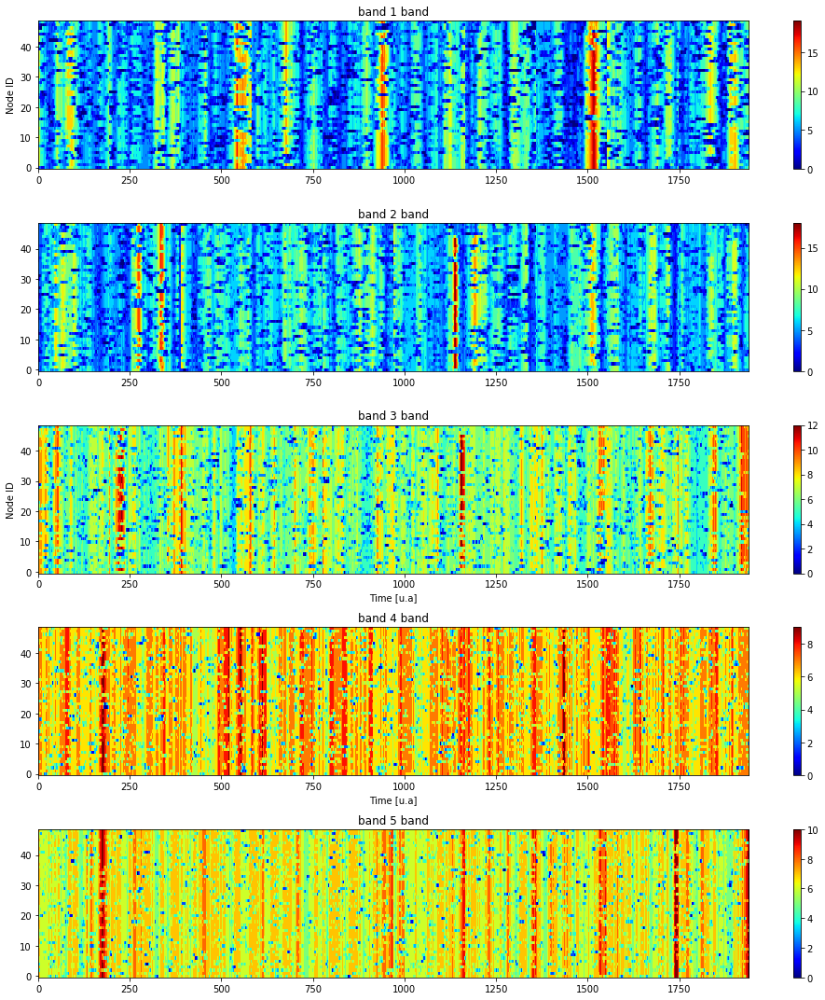

In [66]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q['coreness'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_coreness.png')

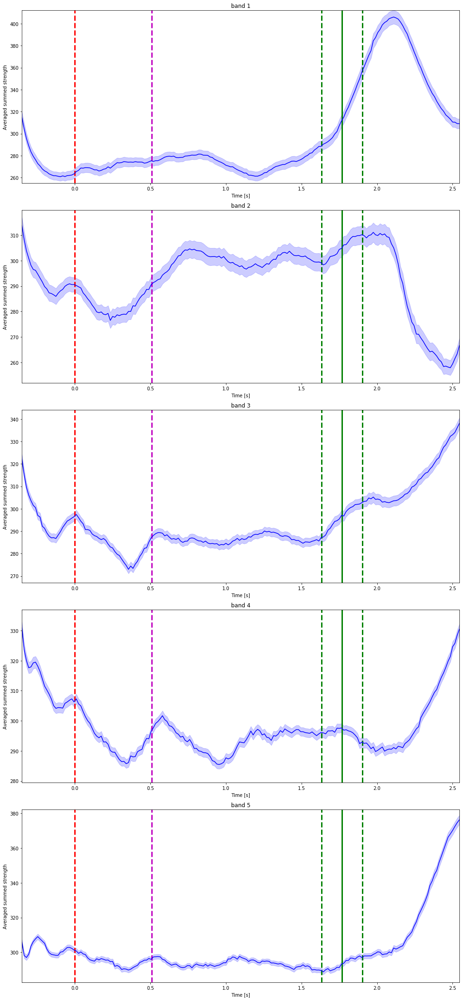

In [67]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    s_d = Q['coreness'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_coreness.png')

### Coreness - Excess

In [ ]:
for i in range(len(net.bands)):
    Qr['coreness'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in tqdm( range(len(filtered_trials)) ):
    for i in range(len(net.bands)):
        Qr['coreness'][str(i)][:,t,:] = compute_nodes_coreness(A_r[:,:,i,t,:], is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 2171.73it/s]

100%|██████████| 194/194 [00:00<00:00, 3018.28it/s]

100%|██████████| 194/194 [00:00<00:00, 3231.50it/s]

100%|██████████| 194/194 [00:00<00:00, 3242.70it/s]

100%|██████████| 194/194 [00:00<00:00, 3475.74it/s]

100%|██████████| 194/194 [00:00<00:00, 3479.49it/s]

100%|██████████| 194/194 [00:00<00:00, 3476.32it/s]

100%|██████████| 194/194 [00:00<00:00, 3460.56it/s]

100%|██████████| 194/194 [00:00<00:00, 3390.58it/s]

100%|██████████| 194/194 [00:00<00:00, 3419.98it/s]

100%|██████████| 194/194 [00:00<00:00, 4241.49it/s]

100%|██████████| 194/194 [00:00<00:00, 4489.92it/s]

100%|██████████| 194/194 [00:00<00:00, 4530.55it/s]

100%|██████████| 194/194 [00:00<00:00, 4556.98it/s]

100%|██████████| 194/194 [00:00<00:00, 4567.32it/s]

100%|██████████| 194/194 [00:00<00:00, 4572.58it/s]

100%|██████████| 194/194 [00:00<00:00, 4554.10it/s]

100%|██████████| 194/194 [00:00<00:00, 4504.16it/s]

100%|██████████| 194/194 [00:00<00:00, 4580.04

100%|██████████| 194/194 [00:00<00:00, 4538.88it/s]

100%|██████████| 194/194 [00:00<00:00, 4527.55it/s]

100%|██████████| 194/194 [00:00<00:00, 4569.96it/s]

100%|██████████| 194/194 [00:00<00:00, 4545.45it/s]

100%|██████████| 194/194 [00:00<00:00, 4519.85it/s]

100%|██████████| 194/194 [00:00<00:00, 4527.19it/s]

100%|██████████| 194/194 [00:00<00:00, 4493.59it/s]

100%|██████████| 194/194 [00:00<00:00, 4529.76it/s]

100%|██████████| 194/194 [00:00<00:00, 4560.81it/s]

100%|██████████| 194/194 [00:00<00:00, 4556.01it/s]

100%|██████████| 194/194 [00:00<00:00, 4477.76it/s]

100%|██████████| 194/194 [00:00<00:00, 4510.48it/s]

100%|██████████| 194/194 [00:00<00:00, 4495.45it/s]

100%|██████████| 194/194 [00:00<00:00, 4494.71it/s]

100%|██████████| 194/194 [00:00<00:00, 4582.00it/s]

100%|██████████| 194/194 [00:00<00:00, 4544.23it/s]

100%|██████████| 194/194 [00:00<00:00, 4237.77it/s]

100%|██████████| 194/194 [00:00<00:00, 4541.87it/s]

100%|██████████| 194/194 [00:00<00:00, 4509.50

100%|██████████| 194/194 [00:00<00:00, 4563.14it/s]

100%|██████████| 194/194 [00:00<00:00, 4580.66it/s]

100%|██████████| 194/194 [00:00<00:00, 4570.24it/s]

100%|██████████| 194/194 [00:00<00:00, 4564.76it/s]

100%|██████████| 194/194 [00:00<00:00, 4550.54it/s]

100%|██████████| 194/194 [00:00<00:00, 4571.53it/s]

100%|██████████| 194/194 [00:00<00:00, 4570.65it/s]

100%|██████████| 194/194 [00:00<00:00, 4564.60it/s]

100%|██████████| 194/194 [00:00<00:00, 4570.83it/s]

100%|██████████| 194/194 [00:00<00:00, 4576.31it/s]

100%|██████████| 194/194 [00:00<00:00, 4565.86it/s]

100%|██████████| 194/194 [00:00<00:00, 4539.90it/s]

100%|██████████| 194/194 [00:00<00:00, 4571.11it/s]

100%|██████████| 194/194 [00:00<00:00, 4567.24it/s]

100%|██████████| 194/194 [00:00<00:00, 4562.71it/s]

100%|██████████| 194/194 [00:00<00:00, 4565.73it/s]

100%|██████████| 194/194 [00:00<00:00, 4563.37it/s]

100%|██████████| 194/194 [00:00<00:00, 4571.47it/s]

100%|██████████| 194/194 [00:00<00:00, 4560.10

100%|██████████| 194/194 [00:00<00:00, 4468.03it/s]

100%|██████████| 194/194 [00:00<00:00, 4469.94it/s]

100%|██████████| 194/194 [00:00<00:00, 4421.80it/s]

100%|██████████| 194/194 [00:00<00:00, 4517.14it/s]

100%|██████████| 194/194 [00:00<00:00, 4466.12it/s]

100%|██████████| 194/194 [00:00<00:00, 4463.64it/s]

100%|██████████| 194/194 [00:00<00:00, 4543.32it/s]

100%|██████████| 194/194 [00:00<00:00, 4443.53it/s]

100%|██████████| 194/194 [00:00<00:00, 4482.03it/s]

100%|██████████| 194/194 [00:00<00:00, 4438.49it/s]

100%|██████████| 194/194 [00:00<00:00, 4519.92it/s]

100%|██████████| 194/194 [00:00<00:00, 4515.61it/s]

100%|██████████| 194/194 [00:00<00:00, 4540.00it/s]

100%|██████████| 194/194 [00:00<00:00, 4524.98it/s]

100%|██████████| 194/194 [00:00<00:00, 4523.87it/s]

100%|██████████| 194/194 [00:00<00:00, 4520.78it/s]

100%|██████████| 194/194 [00:00<00:00, 4518.64it/s]

100%|██████████| 194/194 [00:00<00:00, 4528.78it/s]

100%|██████████| 194/194 [00:00<00:00, 3046.66

100%|██████████| 194/194 [00:00<00:00, 4507.81it/s]

100%|██████████| 194/194 [00:00<00:00, 4467.73it/s]

100%|██████████| 194/194 [00:00<00:00, 4507.11it/s]

100%|██████████| 194/194 [00:00<00:00, 4480.35it/s]

100%|██████████| 194/194 [00:00<00:00, 4520.90it/s]

100%|██████████| 194/194 [00:00<00:00, 4502.07it/s]

100%|██████████| 194/194 [00:00<00:00, 4480.87it/s]

100%|██████████| 194/194 [00:00<00:00, 4509.95it/s]

100%|██████████| 194/194 [00:00<00:00, 4497.52it/s]

100%|██████████| 194/194 [00:00<00:00, 4486.55it/s]

100%|██████████| 194/194 [00:00<00:00, 4493.86it/s]

100%|██████████| 194/194 [00:00<00:00, 4518.07it/s]

100%|██████████| 194/194 [00:00<00:00, 4524.42it/s]

100%|██████████| 194/194 [00:00<00:00, 4327.20it/s]

100%|██████████| 194/194 [00:00<00:00, 4517.42it/s]

100%|██████████| 194/194 [00:00<00:00, 4463.62it/s]

100%|██████████| 194/194 [00:00<00:00, 4524.15it/s]

100%|██████████| 194/194 [00:00<00:00, 4514.43it/s]

100%|██████████| 194/194 [00:00<00:00, 4493.12

100%|██████████| 194/194 [00:00<00:00, 4441.47it/s]

100%|██████████| 194/194 [00:00<00:00, 4436.84it/s]

100%|██████████| 194/194 [00:00<00:00, 4534.99it/s]

100%|██████████| 194/194 [00:00<00:00, 4512.13it/s]

100%|██████████| 194/194 [00:00<00:00, 4522.64it/s]

100%|██████████| 194/194 [00:00<00:00, 4502.32it/s]

100%|██████████| 194/194 [00:00<00:00, 4519.47it/s]

100%|██████████| 194/194 [00:00<00:00, 4452.63it/s]

100%|██████████| 194/194 [00:00<00:00, 4527.60it/s]

100%|██████████| 194/194 [00:00<00:00, 4508.68it/s]

100%|██████████| 194/194 [00:00<00:00, 4507.18it/s]

100%|██████████| 194/194 [00:00<00:00, 4505.93it/s]

100%|██████████| 194/194 [00:00<00:00, 4511.33it/s]

100%|██████████| 194/194 [00:00<00:00, 4296.15it/s]

100%|██████████| 194/194 [00:00<00:00, 4504.14it/s]

100%|██████████| 194/194 [00:00<00:00, 4506.58it/s]

100%|██████████| 194/194 [00:00<00:00, 4501.25it/s]

100%|██████████| 194/194 [00:00<00:00, 4523.97it/s]

100%|██████████| 194/194 [00:00<00:00, 4508.50

100%|██████████| 194/194 [00:00<00:00, 4512.38it/s]

100%|██████████| 194/194 [00:00<00:00, 4512.11it/s]

100%|██████████| 194/194 [00:00<00:00, 4520.43it/s]

100%|██████████| 194/194 [00:00<00:00, 4516.61it/s]

100%|██████████| 194/194 [00:00<00:00, 4520.75it/s]

100%|██████████| 194/194 [00:00<00:00, 4506.56it/s]

100%|██████████| 194/194 [00:00<00:00, 4513.51it/s]

100%|██████████| 194/194 [00:00<00:00, 4523.19it/s]

100%|██████████| 194/194 [00:00<00:00, 4531.02it/s]

100%|██████████| 194/194 [00:00<00:00, 4522.29it/s]

100%|██████████| 194/194 [00:00<00:00, 4517.72it/s]

100%|██████████| 194/194 [00:00<00:00, 4504.94it/s]

100%|██████████| 194/194 [00:00<00:00, 4342.53it/s]

100%|██████████| 194/194 [00:00<00:00, 4510.78it/s]

100%|██████████| 194/194 [00:00<00:00, 4516.16it/s]

100%|██████████| 194/194 [00:00<00:00, 4491.71it/s]

100%|██████████| 194/194 [00:00<00:00, 4550.36it/s]

100%|██████████| 194/194 [00:00<00:00, 4502.09it/s]

100%|██████████| 194/194 [00:00<00:00, 4523.12

100%|██████████| 194/194 [00:00<00:00, 4481.64it/s]

100%|██████████| 194/194 [00:00<00:00, 4495.90it/s]

100%|██████████| 194/194 [00:00<00:00, 4493.96it/s]

100%|██████████| 194/194 [00:00<00:00, 4500.30it/s]

100%|██████████| 194/194 [00:00<00:00, 4523.72it/s]

100%|██████████| 194/194 [00:00<00:00, 4503.24it/s]

100%|██████████| 194/194 [00:00<00:00, 4499.38it/s]

100%|██████████| 194/194 [00:00<00:00, 4476.46it/s]

100%|██████████| 194/194 [00:00<00:00, 4511.43it/s]

100%|██████████| 194/194 [00:00<00:00, 4494.58it/s]

100%|██████████| 194/194 [00:00<00:00, 4517.79it/s]

100%|██████████| 194/194 [00:00<00:00, 4511.35it/s]

100%|██████████| 194/194 [00:00<00:00, 4295.24it/s]

100%|██████████| 194/194 [00:00<00:00, 4506.41it/s]

100%|██████████| 194/194 [00:00<00:00, 4507.43it/s]

100%|██████████| 194/194 [00:00<00:00, 4492.72it/s]

100%|██████████| 194/194 [00:00<00:00, 4515.03it/s]

100%|██████████| 194/194 [00:00<00:00, 4479.93it/s]

100%|██████████| 194/194 [00:00<00:00, 4504.71

100%|██████████| 194/194 [00:00<00:00, 3682.61it/s]

100%|██████████| 194/194 [00:00<00:00, 4442.10it/s]

100%|██████████| 194/194 [00:00<00:00, 4437.76it/s]

100%|██████████| 194/194 [00:00<00:00, 4422.54it/s]

100%|██████████| 194/194 [00:00<00:00, 4383.80it/s]

100%|██████████| 194/194 [00:00<00:00, 4387.18it/s]

100%|██████████| 194/194 [00:00<00:00, 4360.03it/s]

100%|██████████| 194/194 [00:00<00:00, 4406.04it/s]

100%|██████████| 194/194 [00:00<00:00, 4402.47it/s]

100%|██████████| 194/194 [00:00<00:00, 4462.32it/s]

100%|██████████| 194/194 [00:00<00:00, 4448.90it/s]

100%|██████████| 194/194 [00:00<00:00, 4146.64it/s]

100%|██████████| 194/194 [00:00<00:00, 4449.36it/s]

100%|██████████| 194/194 [00:00<00:00, 4444.79it/s]

100%|██████████| 194/194 [00:00<00:00, 4445.62it/s]

100%|██████████| 194/194 [00:00<00:00, 4464.50it/s]

100%|██████████| 194/194 [00:00<00:00, 4470.61it/s]

100%|██████████| 194/194 [00:00<00:00, 4449.65it/s]

100%|██████████| 194/194 [00:00<00:00, 4440.82

100%|██████████| 194/194 [00:00<00:00, 4448.68it/s]

100%|██████████| 194/194 [00:00<00:00, 4440.82it/s]

100%|██████████| 194/194 [00:00<00:00, 4422.64it/s]

100%|██████████| 194/194 [00:00<00:00, 4449.53it/s]

100%|██████████| 194/194 [00:00<00:00, 4284.84it/s]

100%|██████████| 194/194 [00:00<00:00, 4444.43it/s]

100%|██████████| 194/194 [00:00<00:00, 4459.29it/s]

100%|██████████| 194/194 [00:00<00:00, 4458.14it/s]

100%|██████████| 194/194 [00:00<00:00, 4471.76it/s]

100%|██████████| 194/194 [00:00<00:00, 4455.60it/s]

100%|██████████| 194/194 [00:00<00:00, 4462.86it/s]

100%|██████████| 194/194 [00:00<00:00, 4261.59it/s]

100%|██████████| 194/194 [00:00<00:00, 4460.95it/s]

100%|██████████| 194/194 [00:00<00:00, 4445.08it/s]

100%|██████████| 194/194 [00:00<00:00, 4472.13it/s]

100%|██████████| 194/194 [00:00<00:00, 4453.45it/s]

100%|██████████| 194/194 [00:00<00:00, 4473.19it/s]

100%|██████████| 194/194 [00:00<00:00, 4456.89it/s]

100%|██████████| 194/194 [00:00<00:00, 4450.41

100%|██████████| 194/194 [00:00<00:00, 4404.45it/s]

100%|██████████| 194/194 [00:00<00:00, 4407.05it/s]

100%|██████████| 194/194 [00:00<00:00, 4365.81it/s]

100%|██████████| 194/194 [00:00<00:00, 4357.07it/s]

100%|██████████| 194/194 [00:00<00:00, 4363.58it/s]

100%|██████████| 194/194 [00:00<00:00, 4326.58it/s]

100%|██████████| 194/194 [00:00<00:00, 4336.88it/s]

100%|██████████| 194/194 [00:00<00:00, 4398.49it/s]

100%|██████████| 194/194 [00:00<00:00, 4244.21it/s]

100%|██████████| 194/194 [00:00<00:00, 4410.20it/s]

100%|██████████| 194/194 [00:00<00:00, 4412.26it/s]

100%|██████████| 194/194 [00:00<00:00, 4439.12it/s]

100%|██████████| 194/194 [00:00<00:00, 4423.77it/s]

100%|██████████| 194/194 [00:00<00:00, 3058.56it/s]

100%|██████████| 194/194 [00:00<00:00, 4189.49it/s]

100%|██████████| 194/194 [00:00<00:00, 4433.87it/s]

100%|██████████| 194/194 [00:00<00:00, 4419.90it/s]

100%|██████████| 194/194 [00:00<00:00, 4422.16it/s]

100%|██████████| 194/194 [00:00<00:00, 4387.87

100%|██████████| 194/194 [00:00<00:00, 4561.51it/s]

100%|██████████| 194/194 [00:00<00:00, 4566.29it/s]

100%|██████████| 194/194 [00:00<00:00, 4554.25it/s]

100%|██████████| 194/194 [00:00<00:00, 4546.14it/s]

100%|██████████| 194/194 [00:00<00:00, 4365.48it/s]

100%|██████████| 194/194 [00:00<00:00, 4520.20it/s]

100%|██████████| 194/194 [00:00<00:00, 4543.57it/s]

100%|██████████| 194/194 [00:00<00:00, 4568.09it/s]

100%|██████████| 194/194 [00:00<00:00, 4583.47it/s]

100%|██████████| 194/194 [00:00<00:00, 4563.04it/s]

100%|██████████| 194/194 [00:00<00:00, 4356.95it/s]

100%|██████████| 194/194 [00:00<00:00, 4522.14it/s]

100%|██████████| 194/194 [00:00<00:00, 4538.94it/s]

100%|██████████| 194/194 [00:00<00:00, 4548.98it/s]

100%|██████████| 194/194 [00:00<00:00, 4557.75it/s]

100%|██████████| 194/194 [00:00<00:00, 4566.27it/s]

100%|██████████| 194/194 [00:00<00:00, 4582.21it/s]

100%|██████████| 194/194 [00:00<00:00, 4549.34it/s]

100%|██████████| 194/194 [00:00<00:00, 4457.80

100%|██████████| 194/194 [00:00<00:00, 4566.83it/s]

100%|██████████| 194/194 [00:00<00:00, 4553.01it/s]

100%|██████████| 194/194 [00:00<00:00, 4565.60it/s]

100%|██████████| 194/194 [00:00<00:00, 4556.65it/s]

100%|██████████| 194/194 [00:00<00:00, 4351.80it/s]

100%|██████████| 194/194 [00:00<00:00, 4549.03it/s]

100%|██████████| 194/194 [00:00<00:00, 4567.55it/s]

100%|██████████| 194/194 [00:00<00:00, 4549.75it/s]

100%|██████████| 194/194 [00:00<00:00, 4577.31it/s]

100%|██████████| 194/194 [00:00<00:00, 4590.38it/s]

100%|██████████| 194/194 [00:00<00:00, 4627.47it/s]

100%|██████████| 194/194 [00:00<00:00, 4374.68it/s]

100%|██████████| 194/194 [00:00<00:00, 4545.63it/s]

100%|██████████| 194/194 [00:00<00:00, 4540.66it/s]

100%|██████████| 194/194 [00:00<00:00, 4547.31it/s]

100%|██████████| 194/194 [00:00<00:00, 4567.83it/s]

100%|██████████| 194/194 [00:00<00:00, 4564.63it/s]

100%|██████████| 194/194 [00:00<00:00, 3017.61it/s]

100%|██████████| 194/194 [00:00<00:00, 4484.63

100%|██████████| 194/194 [00:00<00:00, 4526.11it/s]

100%|██████████| 194/194 [00:00<00:00, 4491.01it/s]

100%|██████████| 194/194 [00:00<00:00, 4490.57it/s]

100%|██████████| 194/194 [00:00<00:00, 4495.60it/s]

100%|██████████| 194/194 [00:00<00:00, 4507.28it/s]

100%|██████████| 194/194 [00:00<00:00, 4189.38it/s]

100%|██████████| 194/194 [00:00<00:00, 4559.87it/s]

100%|██████████| 194/194 [00:00<00:00, 4537.11it/s]

100%|██████████| 194/194 [00:00<00:00, 4565.11it/s]

100%|██████████| 194/194 [00:00<00:00, 4570.40it/s]

100%|██████████| 194/194 [00:00<00:00, 4503.64it/s]

100%|██████████| 194/194 [00:00<00:00, 4517.39it/s]

100%|██████████| 194/194 [00:00<00:00, 4494.96it/s]

100%|██████████| 194/194 [00:00<00:00, 4446.27it/s]

100%|██████████| 194/194 [00:00<00:00, 4437.86it/s]

100%|██████████| 194/194 [00:00<00:00, 4472.77it/s]

100%|██████████| 194/194 [00:00<00:00, 4442.17it/s]

100%|██████████| 194/194 [00:00<00:00, 4509.20it/s]

100%|██████████| 194/194 [00:00<00:00, 4459.46

In [17]:
plt.figure(figsize=(8,20))
for j in tqdm( range(net.bands.shape[0]) ):
    # Summed for nodes
    null = net.reshape_trials(Qr['coreness'][str(j)]).sum(axis = 0)
    orig = net.reshape_trials(Q['coreness'][str(j)]).sum(axis = 0)
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = E.mean(axis = 0)
    # Std over trials
    Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
    # Plotting
    plt.subplot(5,1,j+1)
    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([Em.min()-.05, Em.max()+.05])
    if j == 0 or j == 2: plt.ylabel('Excess coreness')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_coreness.png')

  0%|          | 0/5 [00:00<?, ?it/s]


TypeError: reshape_trials() takes 1 positional argument but 2 were given

<Figure size 576x1440 with 0 Axes>

### Clustering

Next we compute the clustering coefficient.

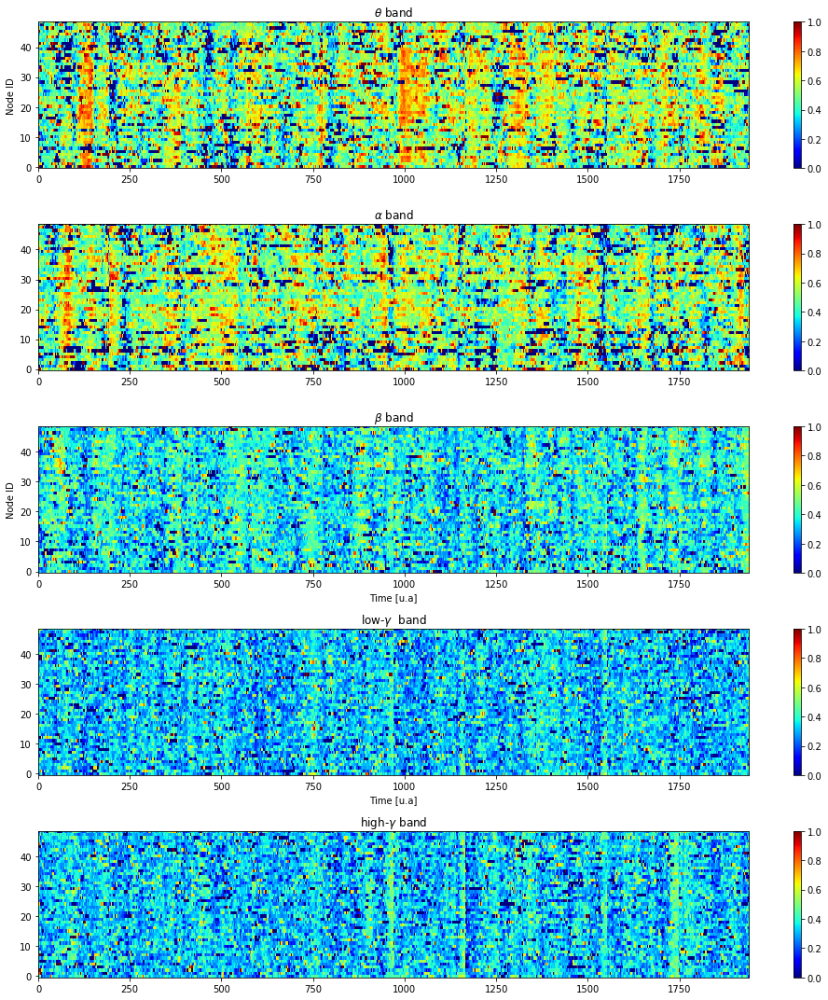

In [18]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(Q['clustering'][str(i)][:,:10*len(net.tarray)], aspect='auto', cmap='jet', origin='lower')
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_clustering.png')

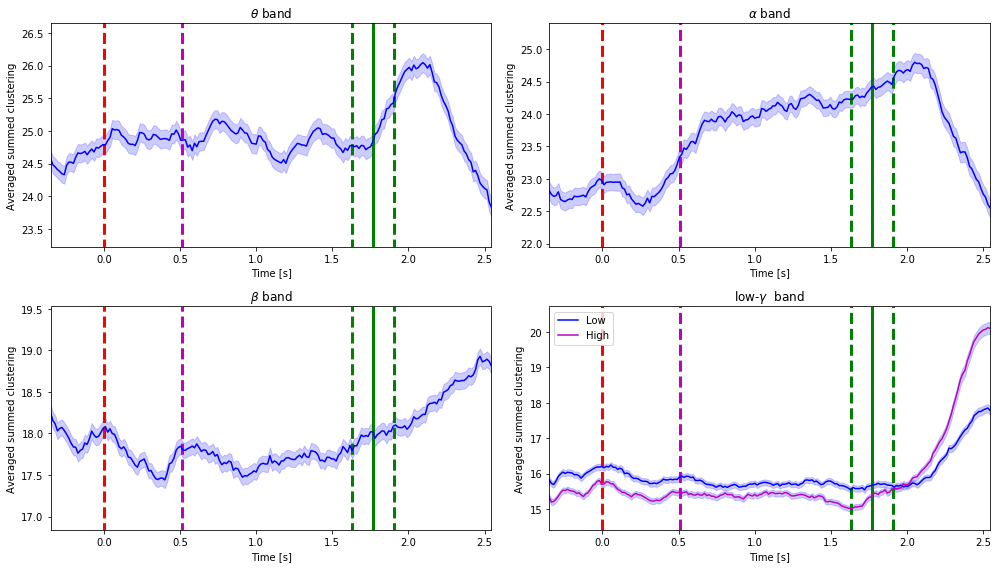

In [19]:
plt.figure(figsize=(14,8))
c = ['b', 'r']
for j in range( len(net.bands)-1 ):
    plt.subplot(2,2,j+1)
    # Original
    #s_d = Q['degree'][str(j)].sum(axis=0)
    #s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
    #s_d_m = s_d.mean(axis = 0)
    #s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    if j == 3:
        s_d = Q['clustering'][str(j)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        s_d = Q['clustering'][str(j+1)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'm')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        plt.legend(['Low', 'High'])
    else:
        s_d = Q['clustering'][str(j)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.6, s_d_m.max()+.6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_clustering.png')

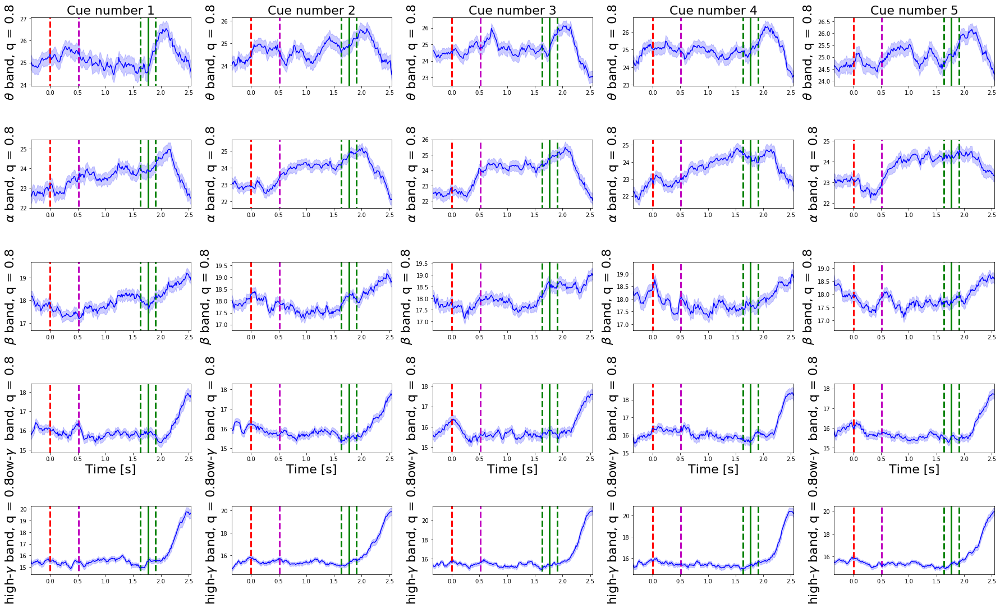

In [26]:
idx = 1
plt.figure(figsize=(25,15))
for i in range( len(net.bands) ):
    for j in range( net.stim_grid.shape[0] ):
        # Computing average over trials for specific cue number
        nt  = np.sum(net.session_info['stim']==j+1)
        s_d = Q['clustering'][str(i)].sum(axis=0)
        #s_d = net.coreness[1,:,i,:].sum(axis=0)
        s_d = s_d[net.stim_grid[j].astype(bool)].reshape(nt, len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        # plot
        plt.subplot( len(net.bands), net.stim_grid.shape[0], idx)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, color = 'b', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([s_d_m.min()-.5, s_d_m.max()+.5])
        plt.vlines(0, s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'r')
        plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'm')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='-', linewidth = 3, color = 'g')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'g')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'g')
        plt.ylabel(bands[i] + ' band, q = 0.8', fontsize=22)
        idx += 1
        if i == 0:
            plt.title('Cue number ' + str(j+1), fontsize=22)
        if i == 3:
            plt.xlabel('Time [s]', fontsize=22)
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_clustering_bands_cue.png')

### Clustering - Excess

100%|██████████| 5/5 [00:00<00:00, 23.36it/s]


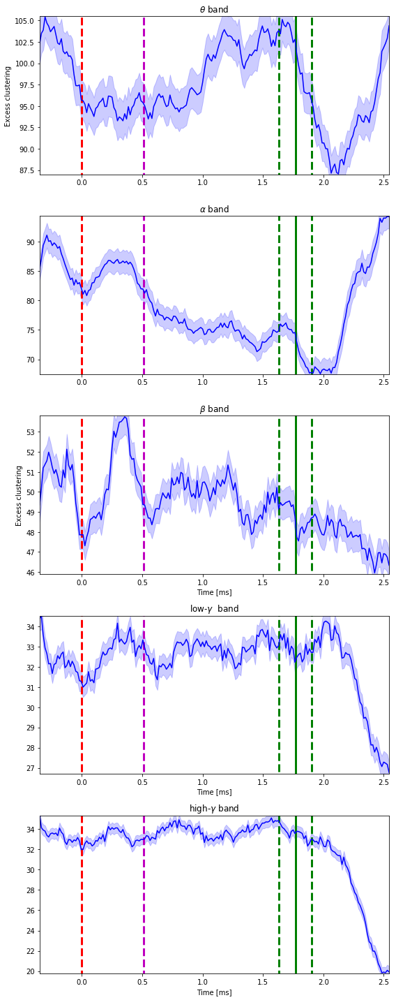

In [39]:
plt.figure(figsize=(8,20))
for j in tqdm( range(net.bands.shape[0]) ):
    # Summed for nodes
    null = net.reshape_trials(Qr['clustering'][str(j)]).sum(axis = 0)
    orig = net.reshape_trials(Q['clustering'][str(j)]).sum(axis = 0)
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = E.mean(axis = 0)
    # Std over trials
    Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
    # Plotting
    plt.subplot(5,1,j+1)
    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([Em.min()-.05, Em.max()+.05])
    if j == 0 or j == 2: plt.ylabel('Excess clustering')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_clustering.png')

### Modularity

TypeError: reshape_trials() takes 1 positional argument but 2 were given

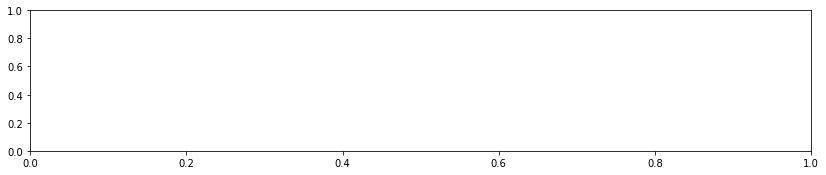

In [20]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(net.reshape_trials( Q['modularity'][str(i)] ), aspect='auto', cmap='jet', origin='lower')
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_modularity.png')

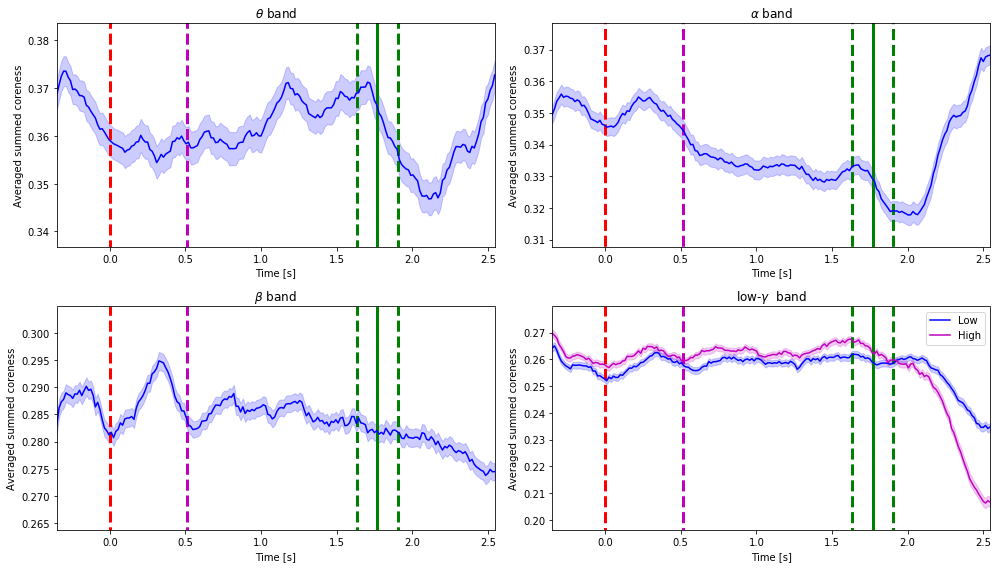

In [21]:
plt.figure(figsize=(14,8))
c = ['b', 'r']
for j in range( len(net.bands)-1 ):
    plt.subplot(2,2,j+1)
    # Original
    if j < 3:
        s_d = Q['modularity'][str(j)]
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        #
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        #
        plt.title(bands[j] + ' band')
    else:
        s_d = Q['modularity'][str(j)]
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        #
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        #
        plt.title(bands[j] + ' band')
        #
        s_d = Q['modularity'][str(j+1)]
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        #
        plt.plot(net.tarray, s_d_m, color = 'm')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')
        plt.legend(['Low', 'High'])
        #
        plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.01, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_modularity.png')

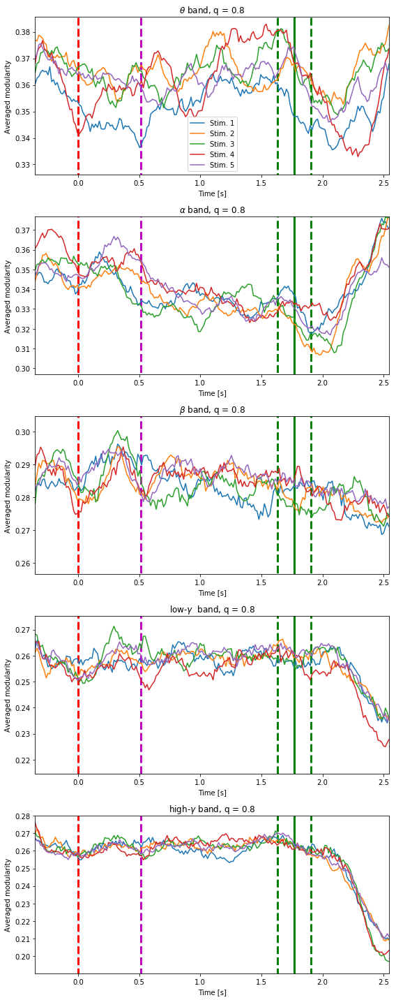

In [42]:
plt.figure(figsize=(8,20))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    s_d = Q['modularity'][str(j)]
    for i in range(net.stim_grid.shape[0]):
        nt  = np.sum(net.session_info['stim']==i+1)
        s_d_aux = s_d[net.stim_grid[i].astype(bool)].copy()
        s_d_aux = s_d_aux.reshape(nt,len(net.tarray))
        s_d_m = s_d_aux.mean(axis = 0)
        s_d_e = s_d_aux.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m)
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2)
    plt.title(bands[j] + ' band, q = 0.8')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-0.02, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
    if j == 0:
        plt.legend(['Stim. 1', 'Stim. 2', 'Stim. 3', 'Stim. 4', 'Stim. 5'])
    plt.ylabel('Averaged modularity')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/modularity_cues.png')

###  Modularity - Chance level

  0%|          | 0/4 [00:00<?, ?it/s]


TypeError: reshape_trials() takes 1 positional argument but 2 were given

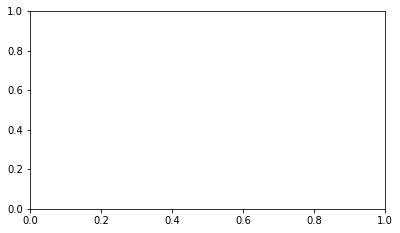

In [22]:
plt.figure(figsize=(14,8))
for j in tqdm( range(net.bands.shape[0]-1) ):
    plt.subplot(2,2,j+1)
    if j<3:
        # Summed for nodes
        null = net.reshape_trials(Qr['modularity'][str(j)])
        orig = net.reshape_trials(Q['modularity'][str(j)])
        # Excess 
        E    = 100*(orig - null)/null
        # Average over trials
        Em   = E.mean(axis = 0)
        # Std over trials
        Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
        # Plotting

        plt.plot(net.tarray, Em, color = 'b')
        plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([Em.min()-.05, Em.max()+.05])
    else:
        # Summed for nodes
        null = net.reshape_trials(Qr['modularity'][str(j)])
        orig = net.reshape_trials(Q['modularity'][str(j)])
        # Excess 
        E    = 100*(orig - null)/null
        # Average over trials
        Em   = E.mean(axis = 0)
        # Std over trials
        Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
        # Plotting

        plt.plot(net.tarray, Em, color = 'b')
        plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([Em.min()-.05, Em.max()+.05])
        # HIGH
        null = net.reshape_trials(Qr['modularity'][str(j+1)])
        orig = net.reshape_trials(Q['modularity'][str(j+1)])
        # Excess 
        E    = 100*(orig - null)/null
        # Average over trials
        Em   = E.mean(axis = 0)
        # Std over trials
        Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
        # Plotting
        plt.plot(net.tarray, Em, color = 'm')
        plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'm', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([Em.min()-.05, Em.max()+.05])
        plt.legend(['Low', 'High'])
    if j == 0 or j == 2: plt.ylabel('Excess modularity')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_modularity.png')

### Allegiance  matrix (theta band)

In order to compute the allegiance matrix we first have to compute the layerwise community labes of each node in order to verity how often they fall in the same module, the allegiance matrix can be computed by using the method __compute_allegiance_matrix__.

In [44]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,0,t_idx], thr=net.coh_thr[0]) )

100%|██████████| 28230/28230 [00:11<00:00, 2407.28it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


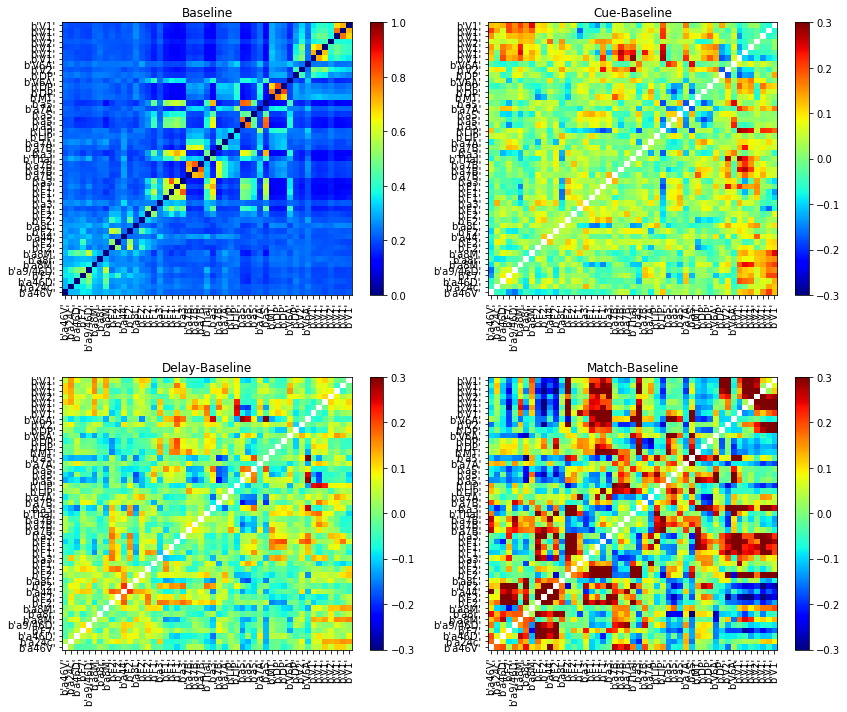

In [21]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_theta.png')

### Allegiance  matrix (alpha band)

In [22]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,1,t_idx], thr=net.coh_thr[1]) )

100%|██████████| 28230/28230 [00:13<00:00, 2136.47it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


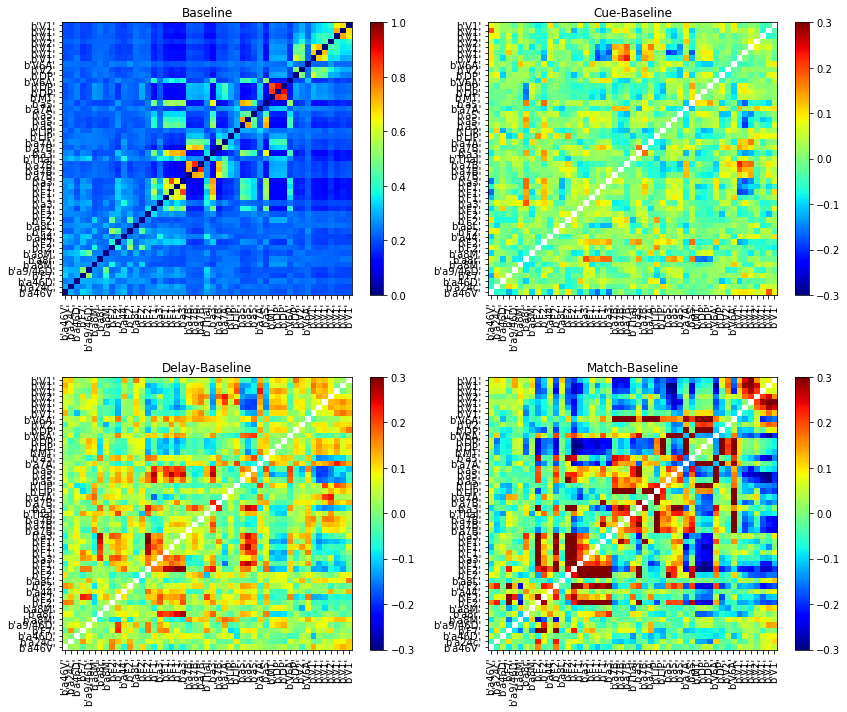

In [23]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_alpha.png')

### Allegiance  matrix (beta band)

In [24]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,2,t_idx], thr=net.coh_thr[2]) )

100%|██████████| 28230/28230 [00:12<00:00, 2256.70it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


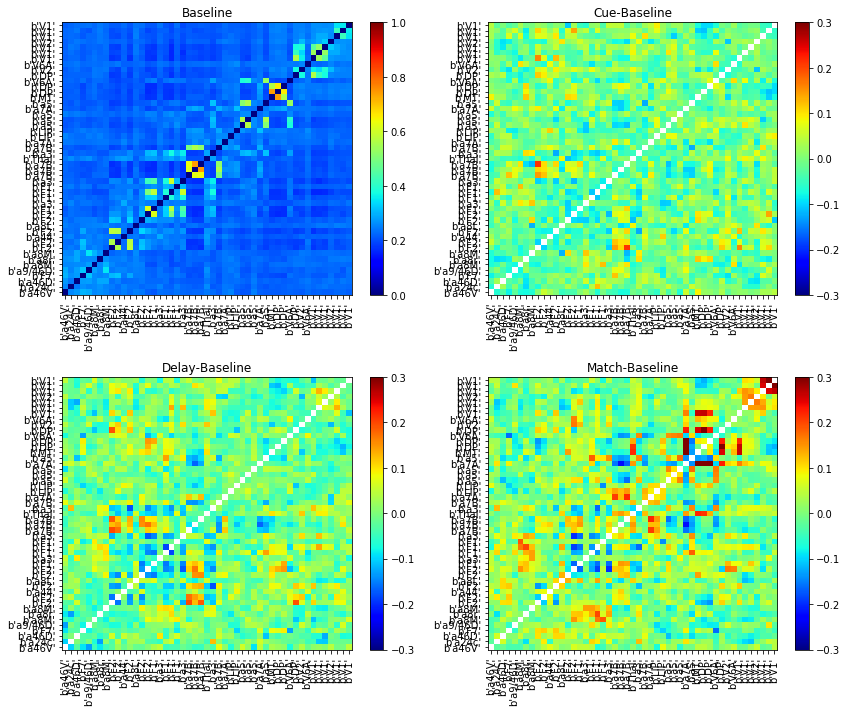

In [25]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_beta.png')

### Allegiance  matrix (low-gamma band)

In [26]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,3,t_idx], thr=net.coh_thr[3]) )

100%|██████████| 28230/28230 [00:12<00:00, 2244.80it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


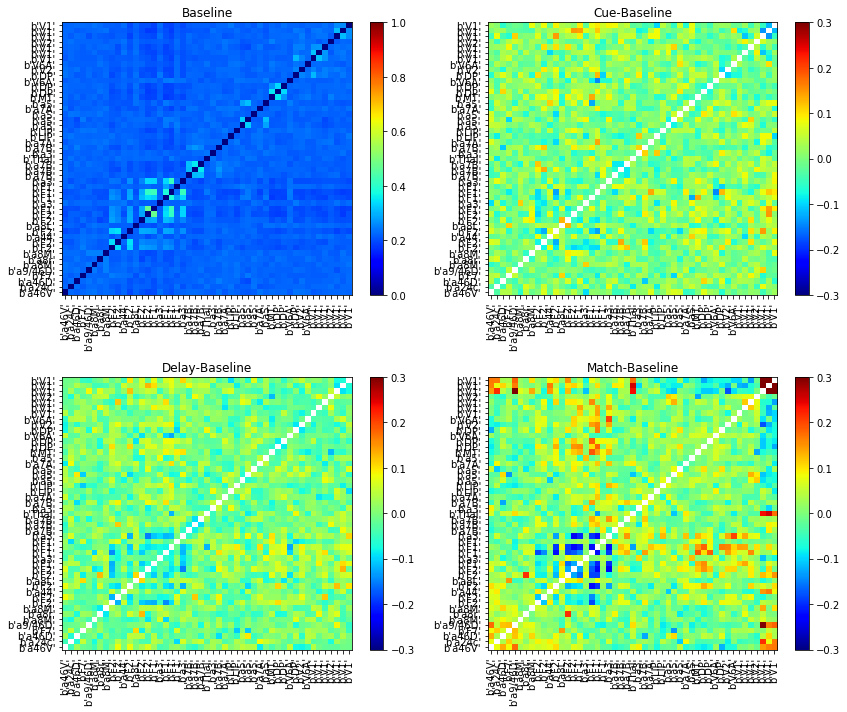

In [27]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_gamma.png')

### Allegiance  matrix (high-gamma band)

In [28]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,4,t_idx], thr=net.coh_thr[3]) )

100%|██████████| 28230/28230 [00:12<00:00, 2235.26it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


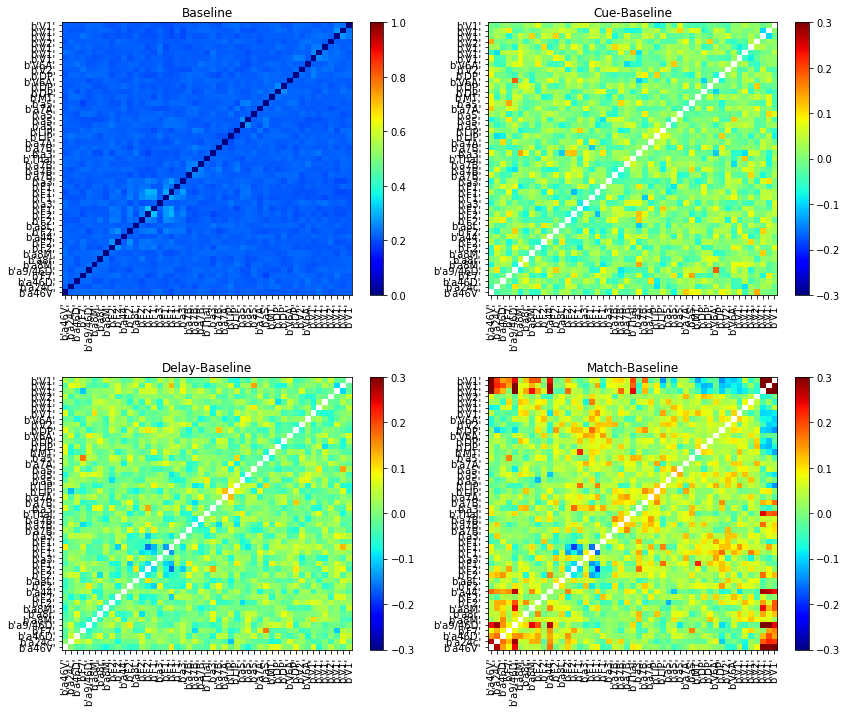

In [29]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_high_gamma.png')

### Plotting on the brain surface

Plotting some of the quantities we measured above in the brain surface.

In [45]:
from GDa.graphics.plot_brain_sketch import plot_node_brain_sketch, plot_edge_brain_sketch

#### Plotting average strength 

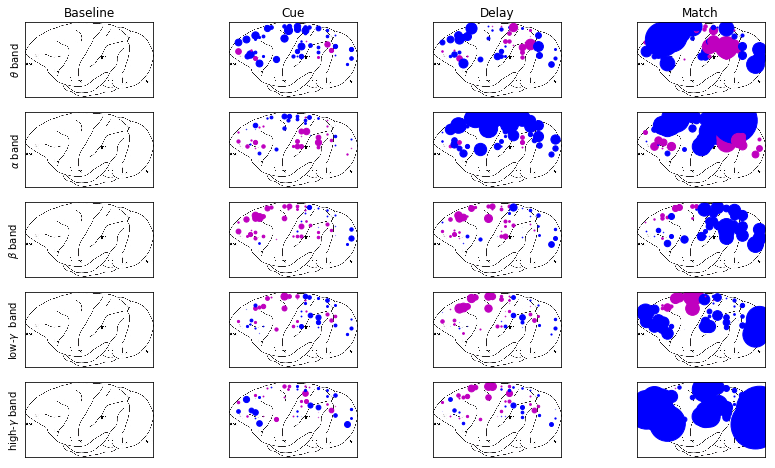

In [46]:
count = 1
alpha = 50
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    # Baseline
    st_b   = Q['degree'][str(i)][:,net.t_baseline].mean(axis=1)
    sst_b  = Q['degree'][str(i)][:,net.t_baseline].std(axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_b-st_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c = Q['degree'][str(i)][:,net.t_cue].mean(axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d = Q['degree'][str(i)][:,net.t_delay].mean(axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m = Q['degree'][str(i)][:,net.t_match].mean(axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/st_brain_map.png')

#### Plotting average coreness 

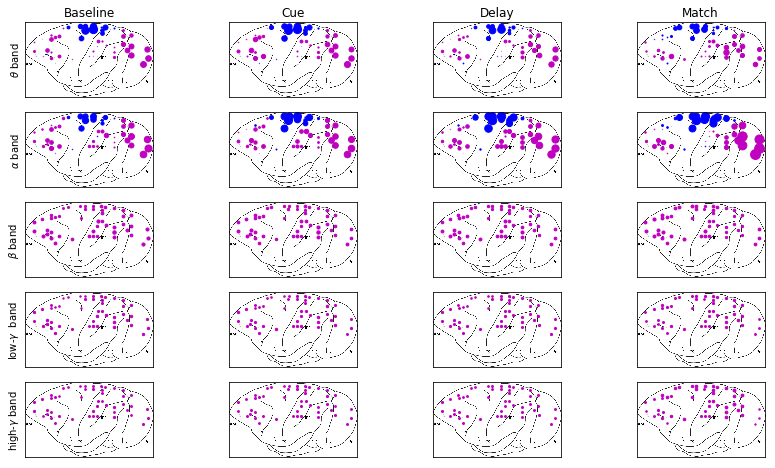

In [47]:
count = 1
alpha = 100
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    # Baseline
    st_b   = Q['coreness'][str(i)][:,net.t_baseline].mean(axis=1)
    sst_b  = Qr['coreness'][str(i)][:,net.t_baseline].mean(axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = Q['coreness'][str(i)][:,net.t_cue].mean(axis=1)
    sst_c = Qr['coreness'][str(i)][:,net.t_cue].mean(axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    #st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = Q['coreness'][str(i)][:,net.t_delay].mean(axis=1)
    sst_d = Qr['coreness'][str(i)][:,net.t_delay].mean(axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    #st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = Q['coreness'][str(i)][:,net.t_match].mean(axis=1)
    sst_m = Qr['coreness'][str(i)][:,net.t_match].mean(axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    #st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map.png')

#### Plotting average coreness (95% percentile)

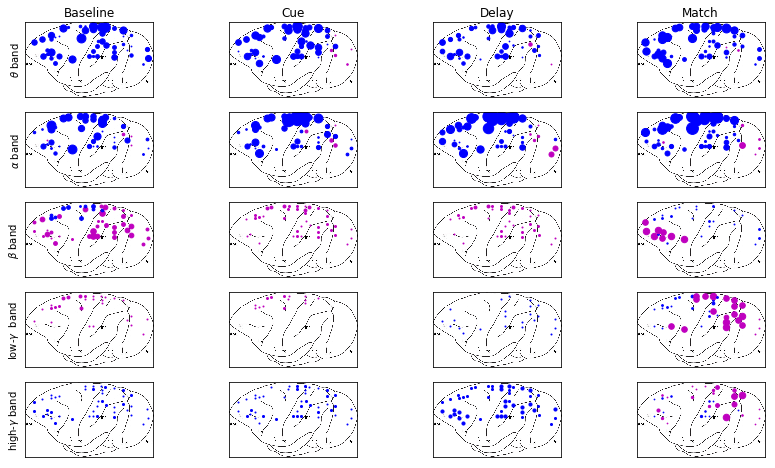

In [48]:
count = 1
alpha = 80
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    # Baseline
    st_b   = np.percentile(Q['coreness'][str(i)][:,net.t_baseline], 95, axis=1)
    sst_b  = np.percentile(Qr['coreness'][str(i)][:,net.t_baseline], 95, axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = np.percentile(Q['coreness'][str(i)][:,net.t_cue], 95, axis=1)
    sst_c = np.percentile(Qr['coreness'][str(i)][:,net.t_cue], 95, axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = np.percentile(Q['coreness'][str(i)][:,net.t_delay], 95, axis=1)
    sst_d = np.percentile(Qr['coreness'][str(i)][:,net.t_delay], 95, axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = np.percentile(Q['coreness'][str(i)][:,net.t_match], 95, axis=1)
    sst_m = np.percentile(Qr['coreness'][str(i)][:,net.t_match], 95, axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map95.png')

#### Plotting average clustering

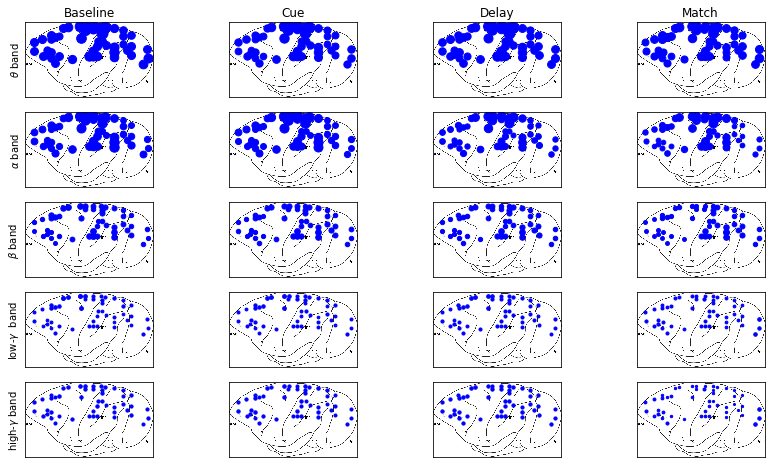

In [51]:
count = 1
alpha = 10
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    # Baseline
    st_b   = Q['clustering'][str(i)][:,net.t_baseline].mean(axis=1)
    sst_b  = Qr['clustering'][str(i)][:,net.t_baseline].mean(axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = Q['clustering'][str(i)][:,net.t_cue].mean(axis=1)
    sst_c = Qr['clustering'][str(i)][:,net.t_cue].mean(axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    #st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = Q['clustering'][str(i)][:,net.t_delay].mean(axis=1)
    sst_d = Qr['clustering'][str(i)][:,net.t_delay].mean(axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    #st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = Q['clustering'][str(i)][:,net.t_match].mean(axis=1)
    sst_m = Qr['clustering'][str(i)][:,net.t_match].mean(axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    #st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/clustering_brain_map.png')

#### Plotting network edges on brain surface

In [ ]:
# Plot edges on brain surface for each time frame
for i in tqdm( range(net.tarray.shape[0]) ):
    if net.tarray[i] < 0:
        color = 'r'
        title = 'Baseline'
    if net.tarray[i] >= 0 and net.tarray[i] < (net.session_info['t_cue_off'][0]-net.session_info['t_cue_on'][0])/1000:
        color = 'b'
        title = 'Cue'
    if net.tarray[i] >= (net.session_info['t_cue_off'][0]-net.session_info['t_cue_on'][0])/1000 and net.tarray[i] < (net.session_info['t_match_on'][0]-net.session_info['t_cue_on'][0])/1000:
        color = 'm'
        title = 'Delay'
    if net.tarray[i] >= (net.session_info['t_match_on'][0]-net.session_info['t_cue_on'][0])/1000:
        color = 'k'
        title = 'Match'
    w = net.super_tensor[:,1,i]>net.coh_thr[1]
    plot_edge_brain_sketch(net.session_info['pairs'], net.session_info['channels_labels'].astype(int), w, edge_color = color)
    plt.title(title)
    plt.savefig('figures/net_'+str(i)+'.png')
    plt.close()

### Finding temporal communities

Using teneto to find the temporal communities (testing)

In [ ]:
from teneto import TemporalNetwork
from teneto import communitydetection

In [ ]:
A    = net.A[:,:,1,:204] + np.transpose(net.A[:,:,1,:204], (1,0,2))
A    = A > net.coh_thr[1]
tnet = TemporalNetwork(from_array = A, nettype = 'bu')

In [ ]:
out = communitydetection.temporal_louvain(tnet, resolution=1, intersliceweight=1, n_iter=100, 
                                          negativeedge='ignore', randomseed=None, 
                                          consensus_threshold=0.5, temporal_consensus=True, 
                                          njobs=40)

In [ ]:
plt.figure(figsize=(8,6))
plt.imshow(out, aspect = 'auto', cmap = 'jet', origin = 'lower', extent = [net.tarray[0],net.tarray[-1],0,48])
plt.colorbar()
plt.title(r'$\omega = 1$, and $\Gamma = 1$')
plt.yticks(net.session_info['areas'], net.session_info['areas'])
plt.xlabel('Time [ms]')

### Comparing with the intervealed fixation task

In [42]:
Q_drt  = np.load('../network_statistics/tt_1_br_1.npy',    allow_pickle=True).item()
Q_drt0 = np.load('../network_statistics/tt_1_br_0.npy',    allow_pickle=True).item() 
Q_fix  = np.load('../network_statistics/tt_2_br_None.npy', allow_pickle=True).item()

### Strength

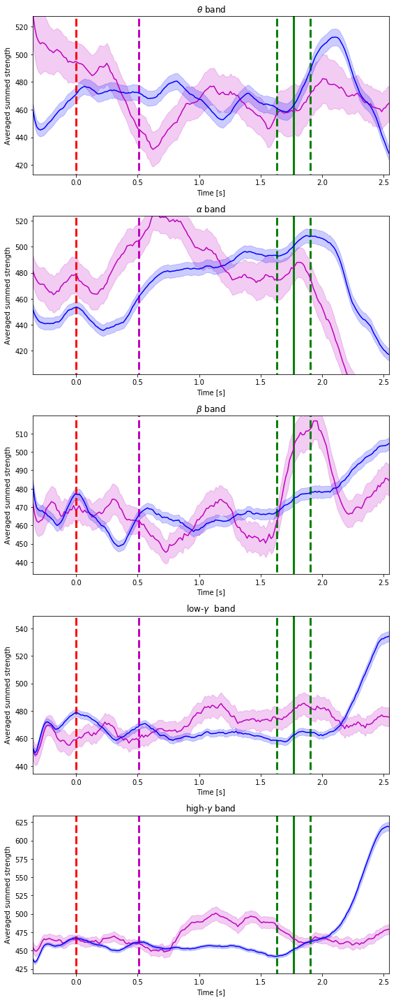

In [43]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_fix['original']['degree'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(76,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['degree'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-15, s_d_m.max()+15])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/strength_fix_drt.png')

### Coreness

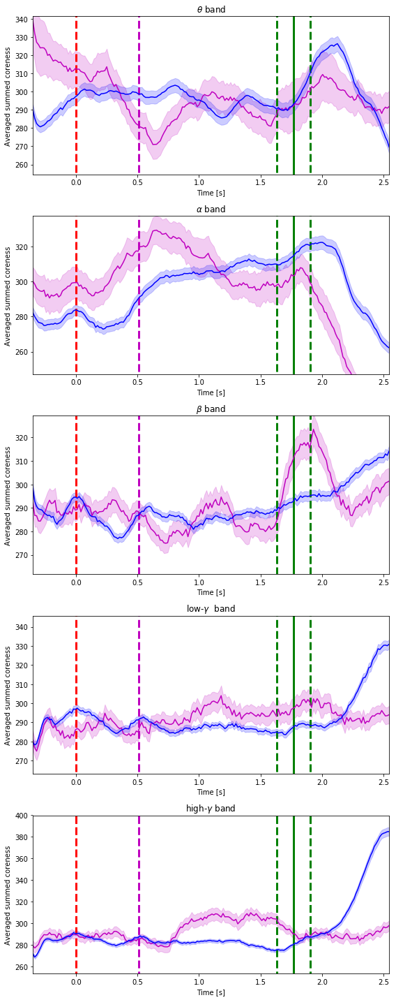

In [44]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_fix['original']['coreness'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(76,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['coreness'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-15, s_d_m.max()+15])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/coreness_fix_drt.png')

### Clustering

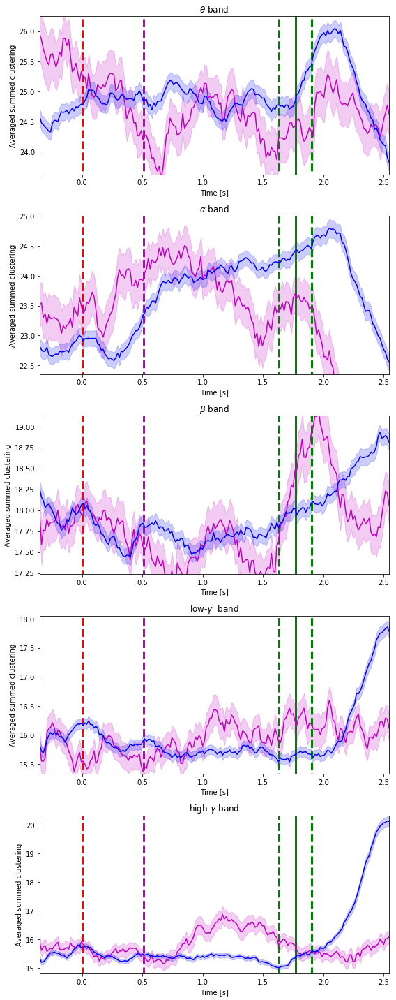

In [45]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_fix['original']['clustering'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(76,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['clustering'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.2, s_d_m.max()+.2])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/clustering_fix_drt.png')

### Modularity

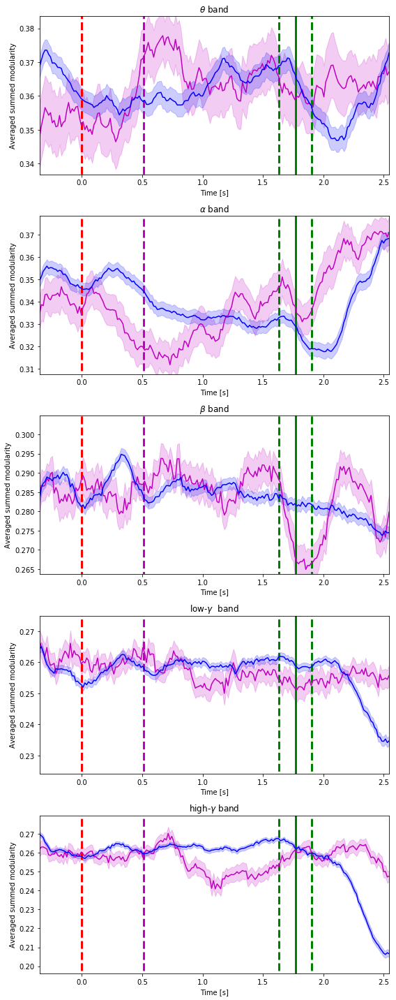

In [46]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_fix['original']['modularity'][str(j)]
    s_d   = s_d.reshape(76,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['modularity'][str(j)]
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.01, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed modularity')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/modularity_fix_drt.png')

### Comparing  DRT for differente behavioral responses

### Strength

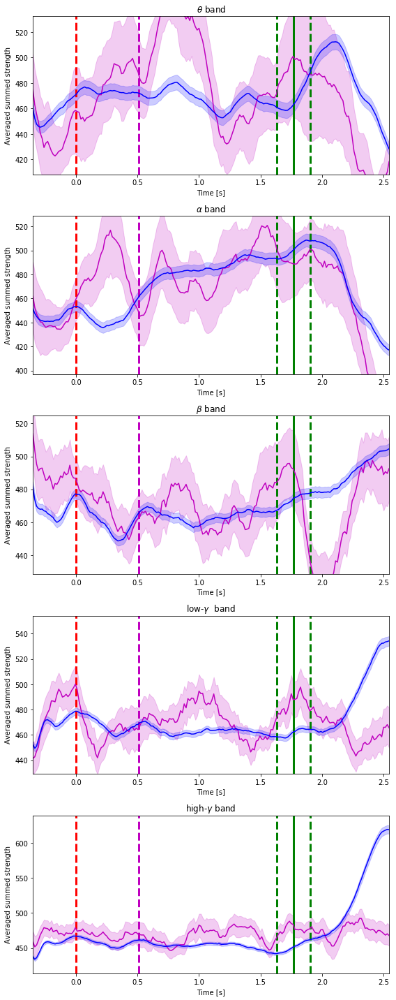

In [34]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_drt0['original']['degree'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(16,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['degree'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-20, s_d_m.max()+20])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/strength_drt_0_1.png')

### Coreness 

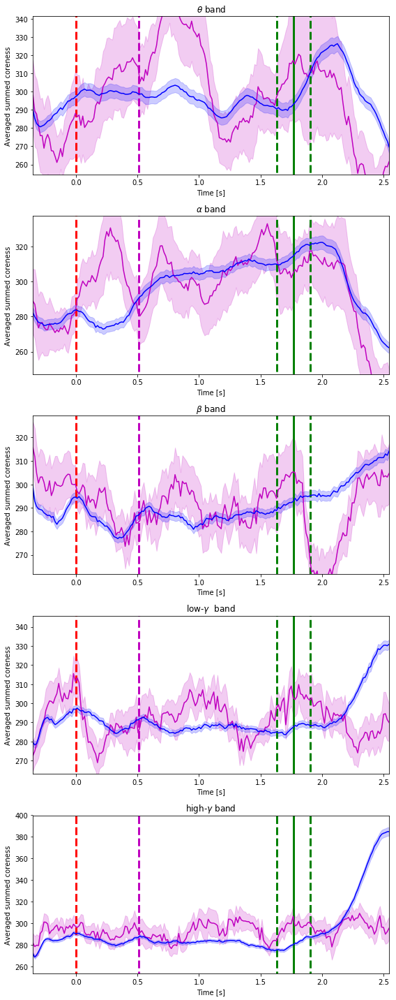

In [35]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_drt0['original']['coreness'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(16,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['coreness'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-15, s_d_m.max()+15])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/coreness_drt_0_1.png')

### Clustering

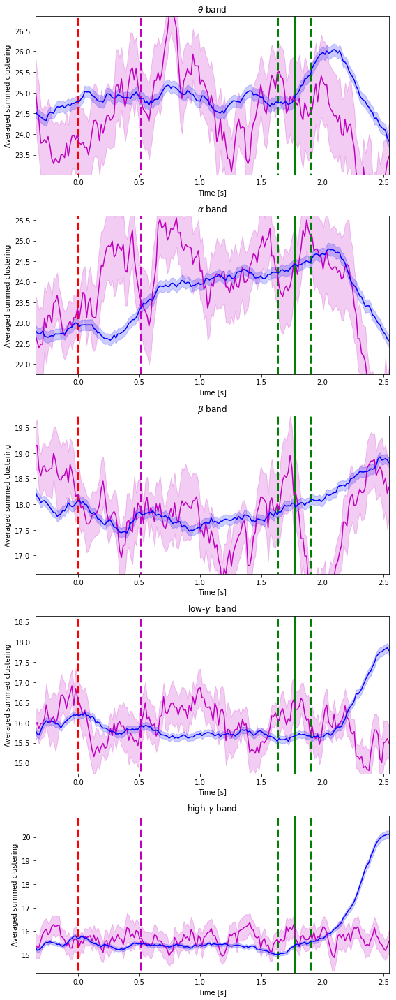

In [36]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_drt0['original']['clustering'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(16,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['clustering'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.8, s_d_m.max()+.8])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/clustering_drt_0_1.png')

### Modularity

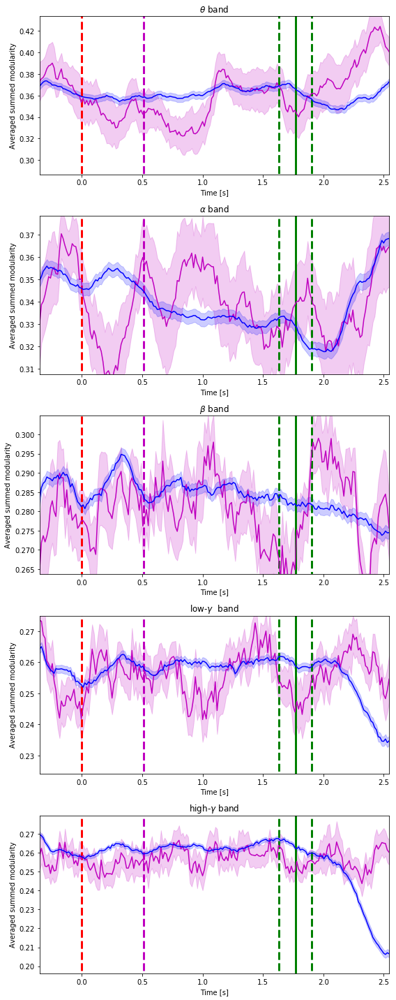

In [37]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_drt0['original']['modularity'][str(j)]
    s_d   = s_d.reshape(16,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['modularity'][str(j)]
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    if j < 1: plt.ylim([s_d_m.min()-.06, s_d_m.max()+.06])
    else: plt.ylim([s_d_m.min()-.01, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed modularity')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/modularity_drt_0_1.png')

### Comparing excess DRT x FIXATION

In [67]:
net_dtr =  temporal_network(raw_path = '../super_tensors/', monkey='lucy', session=1, 
                            date=150128, align_to = 'cue', trial_type = 1, behavioral_response = 1, 
                            trim_borders=True, wt_0=20, wt_1=30)
net_fix =  temporal_network(raw_path = '../super_tensors/', monkey='lucy', session=1, 
                            date=150128, align_to = 'cue', trial_type = 2, behavioral_response = None, 
                            trim_borders=True, wt_0=20, wt_1=30)

In [70]:
Q_drt = np.load('../network_statistics/tt_1_br_1.npy', allow_pickle=True).item()
Q_fix = np.load('../network_statistics/tt_2_br_None.npy', allow_pickle=True).item()

#### Coreness

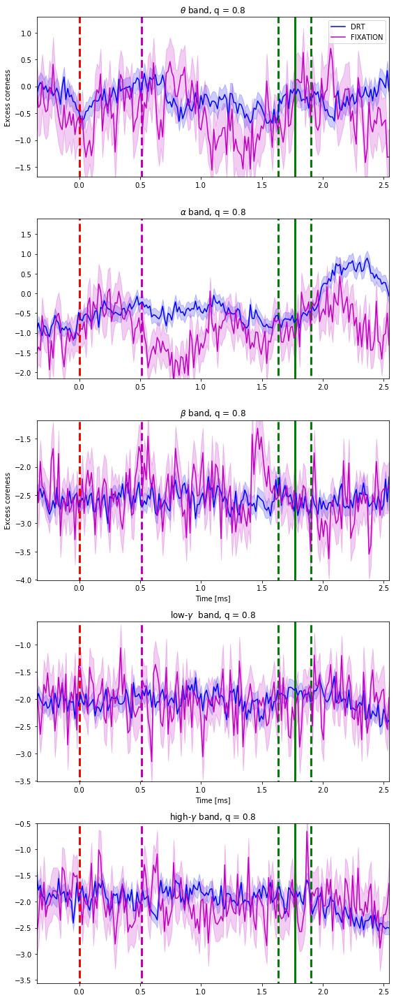

In [71]:
plt.figure(figsize=(8,20))
for i in range(len(net.bands)):
    #DRT
    K_drt_o = net_dtr.reshape_trials( Q_drt['original']['coreness'][str(i)] ).sum(axis = 0)
    K_drt_n = net_dtr.reshape_trials( Q_drt['null']['coreness'][str(i)] ).sum(axis = 0)
    E_drt   = 100*(K_drt_o - K_drt_n)/K_drt_n
    E_drt_m = E_drt.mean(axis = 0)
    E_drt_s = E_drt.std(axis = 0) / np.sqrt(net_dtr.session_info['nT'])
    #FIXATION
    K_fix_o = net_fix.reshape_trials( Q_fix['original']['coreness'][str(i)] ).sum(axis = 0)
    K_fix_n = net_fix.reshape_trials( Q_fix['null']['coreness'][str(i)] ).sum(axis = 0)
    E_fix   = 100*(K_fix_o - K_fix_n)/K_fix_n
    E_fix_m = E_fix.mean(axis = 0)
    E_fix_s = E_fix.std(axis = 0) / np.sqrt(net_fix.session_info['nT'])
    
    plt.subplot(5,1,i+1)
    plt.plot(net_dtr.tarray, E_drt_m, 'b', label = 'DRT')
    plt.fill_between(net_dtr.tarray, E_drt_m-E_drt_s, E_drt_m+E_drt_s, color = 'b', alpha = .2)
    plt.plot(net_dtr.tarray, E_fix_m, 'm', label = 'FIXATION')
    plt.fill_between(net_fix.tarray, E_fix_m-E_fix_s, E_fix_m+E_fix_s, color = 'm', alpha = .2)
    if i == 0: plt.legend()
    if i in [2,3]: plt.xlabel('Time [ms]')
    if i in [0,2]: plt.ylabel('Excess coreness')
    plt.title(bands[i] + ' band, q = 0.8')
    plt.xlim([net_dtr.tarray[0],net_dtr.tarray[-1]])
    plt.ylim([E_drt_m.min()-1, E_drt_m.max()+1])
    plt.vlines(0, E_drt_m.min()-6, E_drt_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net_dtr.session_info['t_cue_off']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()

#### Clustering

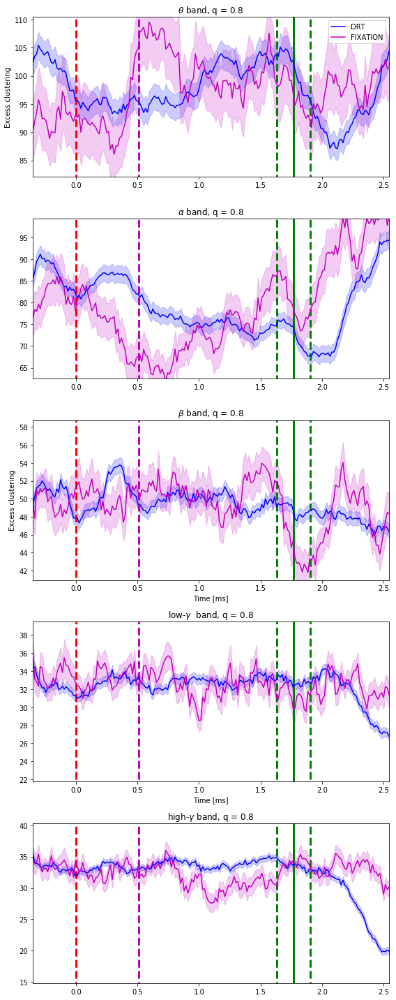

In [72]:
plt.figure(figsize=(8,20))
for i in range(len(net.bands)):
    #DRT
    K_drt_o = net_dtr.reshape_trials( Q_drt['original']['clustering'][str(i)] ).sum(axis = 0)
    K_drt_n = net_dtr.reshape_trials( Q_drt['null']['clustering'][str(i)] ).sum(axis = 0)
    E_drt   = 100*(K_drt_o - K_drt_n)/K_drt_n
    E_drt_m = E_drt.mean(axis = 0)
    E_drt_s = E_drt.std(axis = 0) / np.sqrt(net_dtr.session_info['nT'])
    #FIXATION
    K_fix_o = net_fix.reshape_trials( Q_fix['original']['clustering'][str(i)] ).sum(axis = 0)
    K_fix_n = net_fix.reshape_trials( Q_fix['null']['clustering'][str(i)] ).sum(axis = 0)
    E_fix   = 100*(K_fix_o - K_fix_n)/K_fix_n
    E_fix_m = E_fix.mean(axis = 0)
    E_fix_s = E_fix.std(axis = 0) / np.sqrt(net_fix.session_info['nT'])
    
    plt.subplot(5,1,i+1)
    plt.plot(net_dtr.tarray, E_drt_m, 'b', label = 'DRT')
    plt.fill_between(net_dtr.tarray, E_drt_m-E_drt_s, E_drt_m+E_drt_s, color = 'b', alpha = .2)
    plt.plot(net_dtr.tarray, E_fix_m, 'm', label = 'FIXATION')
    plt.fill_between(net_fix.tarray, E_fix_m-E_fix_s, E_fix_m+E_fix_s, color = 'm', alpha = .2)
    if i == 0: plt.legend()
    if i in [2,3]: plt.xlabel('Time [ms]')
    if i in [0,2]: plt.ylabel('Excess clustering')
    plt.title(bands[i] + ' band, q = 0.8')
    plt.xlim([net_dtr.tarray[0],net_dtr.tarray[-1]])
    plt.ylim([E_drt_m.min()-5, E_drt_m.max()+5])
    plt.vlines(0, E_drt_m.min()-6, E_drt_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net_dtr.session_info['t_cue_off']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()

#### Modularity

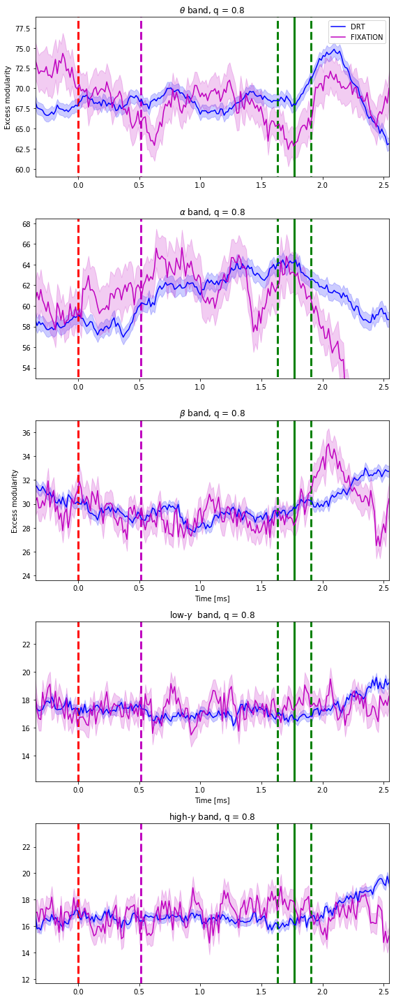

In [74]:
plt.figure(figsize=(8,20))
for i in range(len(net.bands)):
    #DRT
    K_drt_o = net_dtr.reshape_trials( Q_drt['original']['modularity'][str(i)] )
    K_drt_n = net_dtr.reshape_trials( Q_drt['null']['modularity'][str(i)] )
    E_drt   = 100*(K_drt_o - K_drt_n)/K_drt_n
    E_drt_m = E_drt.mean(axis = 0)
    E_drt_s = E_drt.std(axis = 0) / np.sqrt(net_dtr.session_info['nT'])
    #FIXATION
    K_fix_o = net_fix.reshape_trials( Q_fix['original']['modularity'][str(i)] )
    K_fix_n = net_fix.reshape_trials( Q_fix['null']['modularity'][str(i)] )
    E_fix   = 100*(K_fix_o - K_fix_n)/K_fix_n
    E_fix_m = E_fix.mean(axis = 0)
    E_fix_s = E_fix.std(axis = 0) / np.sqrt(net_fix.session_info['nT'])
    
    plt.subplot(5,1,i+1)
    plt.plot(net_dtr.tarray, E_drt_m, 'b', label = 'DRT')
    plt.fill_between(net_dtr.tarray, E_drt_m-E_drt_s, E_drt_m+E_drt_s, color = 'b', alpha = .2)
    plt.plot(net_dtr.tarray, E_fix_m, 'm', label = 'FIXATION')
    plt.fill_between(net_fix.tarray, E_fix_m-E_fix_s, E_fix_m+E_fix_s, color = 'm', alpha = .2)
    if i == 0: plt.legend()
    if i in [2,3]: plt.xlabel('Time [ms]')
    if i in [0,2]: plt.ylabel('Excess modularity')
    plt.title(bands[i] + ' band, q = 0.8')
    plt.xlim([net_dtr.tarray[0],net_dtr.tarray[-1]])
    plt.ylim([E_drt_m.min()-4, E_drt_m.max()+4])
    plt.vlines(0, E_drt_m.min()-20, E_drt_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net_dtr.session_info['t_cue_off']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-20, E_drt_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-20, E_drt_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-20, E_drt_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-20, E_drt_m.max()+20, linestyle='--', linewidth = 3, color = 'g')

    plt.tight_layout()

In [31]:
net.session_info['nT']

750

In [32]:
len(net.tarray)

194

In [33]:
s_d.shape

(104760,)